# Proyecto 03 - Series de Tiempo

## Dataset: Flujo Vehicular por Unidades de Peaje AUSA

**Recuerda descargar el dataset de [aquí](https://data.buenosaires.gob.ar/dataset/flujo-vehicular-por-unidades-peaje-ausa). Deberás descargar -  al menos para comenzar - los años 2017, 2018 y 2019.**

En este notebook te dejamos unas celdas para que puedas comenzar a trabajar con este dataset para los años 2017, 2018 y 2019. Si deseas utilizar otros años, ten en cuenta que deberás hacer el preprocesamiento correspondiente, ya que la estructura de los datos puede variar.

**Importante:** Para el proyecto, debes comenzar con los datos de la autopista Illia, pago en Efectivo.

### Exploración de datos

Dedícale un buen tiempo a hacer un Análisis Exploratorio de Datos. Elige preguntas que creas que puedas responder con este dataset. Por ejemplo, ¿Cuáles son los días y horarios de mayor tráfico? También, estudia autocorrelaciones, resampleos, etc.

#### Componentes de la serie

1. Calcula las componentes estacionales y tendencia de la serie. Interpreta los resultados, si es necesario con información auxiliar (por fuera del dataset) o elementos del dataset que no estés utilizando (por ejemplo, si la tendencia es negativa, ¿puede ser porque se migre a otras formas de pago?).
1. ¿La serie posee valores atípicos? Si es así, interpreta, si es necesario con información auxiliar. **Pista**: primer semestre 2019.

### Predicción a Futuro

Debes implementar un modelo que prediga el tráfico en la autopista Illia para el último trimestre del 2019. 

1. Haz todas las transformaciones de datos que consideres necesarias. Justifica.
1. Evalúa de forma apropiada tus resultados. Justifica la métrica elegida.
1. Elige un modelo benchmark y compara tus resultados con este modelo.
1. Optimiza los hiperparámetros de tu modelo. 
1. Intenta responder la pregunta: ¿Qué información está usando el modelo para predecir?
1. Utiliza el modelo creado para predecir el tráfico en el año 2020. ¿Cómo funciona?
1. Si lo deseas, puedes agregar información de años anteriores a 2017. ¿Mejoran los resultados?

### Para pensar, investigar y, opcionalmente, implementar
1. ¿Cómo incorporarías la información sobre tipo de vehículo, forma de pago, sentido, día de la semana, etc.? En lo que respecta a las predicciones, ¿mejoran o empeoran?
1. ¿Qué ocurre si comparas las series de tiempo entre distintas estaciones de peajes?¿Tienen el mismo comportamiento o hay alguna que sea distinta a las otras? Si es así, ¿hay información auxiliar que te ayude a explicar lo que encuentras?
1. ¿Hay algo que te gustaría investigar o probar?

### **¡Tómate tiempo para investigar y leer mucho!**

### 1. Preparación del Dataset

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import datetime

C:\Users\Usuario\miniconda3\lib\site-packages\numpy\_distributor_init.py:30: UserWarning: loaded more than 1 DLL from .libs:
C:\Users\Usuario\miniconda3\lib\site-packages\numpy\.libs\libopenblas.PYQHXLVVQ7VESDPUVUADXEVJOBGHJPAY.gfortran-win_amd64.dll
C:\Users\Usuario\miniconda3\lib\site-packages\numpy\.libs\libopenblas.WCDJNK7YVMPZQ2ME2ZZHJJRJ3JIKNDB7.gfortran-win_amd64.dll
  warnings.warn("loaded more than 1 DLL from .libs:"


In [2]:
data_2019 = pd.read_csv('flujo-vehicular-2019.csv', sep =',')
data_2018 = pd.read_csv('flujo-vehicular-2018.csv', sep =',')
data_2017 = pd.read_csv('flujo-vehicular-2017.csv', sep =',')

In [3]:
data_2019.info()
data_2019.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 812153 entries, 0 to 812152
Data columns (total 10 columns):
 #   Column          Non-Null Count   Dtype 
---  ------          --------------   ----- 
 0   periodo         812153 non-null  int64 
 1   fecha           812153 non-null  object
 2   hora_inicio     812153 non-null  int64 
 3   hora_fin        812153 non-null  int64 
 4   dia             812153 non-null  object
 5   estacion        812153 non-null  object
 6   sentido         812153 non-null  object
 7   tipo_vehiculo   812153 non-null  object
 8   forma_pago      812153 non-null  object
 9   cantidad_pasos  812153 non-null  int64 
dtypes: int64(4), object(6)
memory usage: 62.0+ MB


,periodo,fecha,hora_inicio,hora_fin,dia,estacion,sentido,tipo_vehiculo,forma_pago,cantidad_pasos
0,2019,2019-01-01,0,1,Martes,Alberti,Centro,Liviano,NO COBRADO,22
1,2019,2019-01-01,0,1,Martes,Alberti,Centro,Liviano,TELEPASE,6
2,2019,2019-01-01,0,1,Martes,Alberti,Provincia,Liviano,NO COBRADO,53
3,2019,2019-01-01,0,1,Martes,Alberti,Provincia,Liviano,TELEPASE,18
4,2019,2019-01-01,0,1,Martes,Avellaneda,Centro,Liviano,EFECTIVO,16


In [4]:
data_2018.info()
data_2018.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1375908 entries, 0 to 1375907
Data columns (total 10 columns):
 #   Column          Non-Null Count    Dtype 
---  ------          --------------    ----- 
 0   periodo         1375908 non-null  int64 
 1   fecha           1375908 non-null  object
 2   hora_inicio     1375908 non-null  int64 
 3   hora_fin        1375908 non-null  int64 
 4   dia             1375908 non-null  object
 5   estacion        1375908 non-null  object
 6   sentido         1375908 non-null  object
 7   tipo_vehiculo   1375908 non-null  object
 8   forma_pago      1375908 non-null  object
 9   cantidad_pasos  1375908 non-null  int64 
dtypes: int64(4), object(6)
memory usage: 105.0+ MB


,periodo,fecha,hora_inicio,hora_fin,dia,estacion,sentido,tipo_vehiculo,forma_pago,cantidad_pasos
0,2018,2018-01-01,0,1,Lunes,Alberdi,Centro,Liviano,NO COBRADO,29
1,2018,2018-01-01,0,1,Lunes,Alberdi,Centro,Liviano,TELEPASE,9
2,2018,2018-01-01,1,2,Lunes,Alberdi,Centro,Liviano,NO COBRADO,73
3,2018,2018-01-01,1,2,Lunes,Alberdi,Centro,Liviano,TELEPASE,39
4,2018,2018-01-01,2,3,Lunes,Alberdi,Centro,Liviano,NO COBRADO,115


In [5]:
data_2017.info()
data_2017.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1372645 entries, 0 to 1372644
Data columns (total 10 columns):
 #   Column          Non-Null Count    Dtype 
---  ------          --------------    ----- 
 0   periodo         1372645 non-null  int64 
 1   fecha           1372645 non-null  object
 2   hora_inicio     1372645 non-null  int64 
 3   hora_fin        1372645 non-null  int64 
 4   dia             1372645 non-null  object
 5   estacion        1372645 non-null  object
 6   sentido         1372645 non-null  object
 7   tipo_vehiculo   1372645 non-null  object
 8   forma_pago      1372645 non-null  object
 9   cantidad_pasos  1372645 non-null  int64 
dtypes: int64(4), object(6)
memory usage: 104.7+ MB


,periodo,fecha,hora_inicio,hora_fin,dia,estacion,sentido,tipo_vehiculo,forma_pago,cantidad_pasos
0,2017,2017-01-01,0,1,Domingo,Alberdi,Centro,Liviano,NO COBRADO,25
1,2017,2017-01-01,0,1,Domingo,Alberdi,Centro,Liviano,TELEPASE,7
2,2017,2017-01-01,1,2,Domingo,Alberdi,Centro,Liviano,NO COBRADO,5
3,2017,2017-01-01,1,2,Domingo,Alberdi,Centro,Liviano,EFECTIVO,2
4,2017,2017-01-01,1,2,Domingo,Alberdi,Centro,Liviano,EFECTIVO,94


Investiguemos que valores toman los campos **estacion, sentido, tipo_vehiculo y forma_pago**

In [6]:
print(data_2019['estacion'].unique())
print(data_2018['estacion'].unique())
print(data_2017['estacion'].unique())

['Alberti' 'Avellaneda' 'Dellepiane' 'Illia' 'Retiro' 'Salguero'
 'Sarmiento' 'PDB']
['Alberdi' 'Avellaneda' 'Dellepiane Centro' 'Dellepiane Liniers' 'Illia'
 'Retiro' 'Salguero' 'Sarmiento']
['Alberdi' 'Avellaneda' 'Dellepiane Centro' 'Dellepiane Liniers' 'Illia'
 'Retiro' 'Salguero' 'Sarmiento']


In [7]:
print(data_2019['sentido'].unique())
print(data_2018['sentido'].unique())
print(data_2017['sentido'].unique())

['Centro' 'Provincia']
['Centro' 'Provincia']
['Centro' 'Provincia']


In [8]:
print(data_2019['tipo_vehiculo'].unique())
print(data_2018['tipo_vehiculo'].unique())
print(data_2017['tipo_vehiculo'].unique())

['Liviano' 'Pesado']
['Liviano' 'Pesado']
['Liviano' 'Pesado']


In [9]:
print(data_2019['forma_pago'].unique())
print(data_2018['forma_pago'].unique())
print(data_2017['forma_pago'].unique())

['NO COBRADO' 'TELEPASE' 'EFECTIVO' 'EXENTO' 'INFRACCION'
 'T. DISCAPACIDAD']
['NO COBRADO' 'TELEPASE' 'EFECTIVO' 'EXENTO' 'TARJETA DISCAPACIDAD'
 'INFRACCION']
['NO COBRADO' 'TELEPASE' 'EFECTIVO' 'TARJETA DISCAPACIDAD' 'EXENTO'
 'INFRACCION' 'MONEDERO' 'Otros']


##### Podemos decir entonces que los años 2017, 2018 y 2019 tienen las siguientes columnas con la siguiente información:

**periodo**: año del dset 

**fecha**: año dia mes

**hora_inicio** hora de inicio de la cuenta de vehiculos (DROP)

**hora_fin** hora de fin de la cuenta de vehiculos (Vamos a usar esta para tomar la hora)

**dia**: dia de la semana 

**estacion**: estaciones de peaje, difieren levemente entre los años (Dellepiane se unifica en 2019, antes habia Dellepiane Liniers y Centro, y se agrega PDB)

**sentido**: Centro o Provincia

**tipo_vehiculo**: Liviano o Pesado

**forma_pago**: Hay varias y varian entre los años.

**cantidad_pasos**: Cantidad de vehiculos

Vamos a estar trabajando con la estación **Illia** y la forma de pago **Efectivo**


In [10]:
#Unimos los 3 datasets, podemos hacerlo asi directamente ya que tienen las mismas columnas
dataset = pd.concat([data_2019, data_2018, data_2017])

#Nos quedamos solamente con la estación Illia y la forma de pago Efectivo
mask = np.logical_and(dataset.estacion=='Illia', dataset.forma_pago == 'EFECTIVO')
dataset = dataset[mask]

#Quitamos las columnas que no vamos a utilizar
dataset.drop(columns = ['periodo','hora_inicio','forma_pago', 'estacion'], inplace = True)

dataset.head()

,fecha,hora_fin,dia,sentido,tipo_vehiculo,cantidad_pasos
80,2019-01-01,2,Martes,Centro,Liviano,537
86,2019-01-01,2,Martes,Centro,Pesado,1
88,2019-01-01,2,Martes,Provincia,Liviano,443
94,2019-01-01,2,Martes,Provincia,Pesado,1
149,2019-01-01,3,Martes,Centro,Liviano,769


In [11]:
#Pasamos la columna fecha a formato datetime, y le unimos la hora_fin como hora
dataset['fecha2'] = pd.to_datetime(dataset.fecha) + pd.to_timedelta(dataset.hora_fin, unit = 'h')

#Quitamos las columnas fecha y hora_fin ya que las incluimos en el campo fecha2
dataset.drop(columns=['fecha','hora_fin'], inplace = True)

dataset.head()

,dia,sentido,tipo_vehiculo,cantidad_pasos,fecha2
80,Martes,Centro,Liviano,537,2019-01-01 02:00:00
86,Martes,Centro,Pesado,1,2019-01-01 02:00:00
88,Martes,Provincia,Liviano,443,2019-01-01 02:00:00
94,Martes,Provincia,Pesado,1,2019-01-01 02:00:00
149,Martes,Centro,Liviano,769,2019-01-01 03:00:00


In [12]:
#Corregimos el nombre de fecha2 a fecha
dataset.rename(columns = {'fecha2':'fecha'}, inplace = True) 
dataset.head()

,dia,sentido,tipo_vehiculo,cantidad_pasos,fecha
80,Martes,Centro,Liviano,537,2019-01-01 02:00:00
86,Martes,Centro,Pesado,1,2019-01-01 02:00:00
88,Martes,Provincia,Liviano,443,2019-01-01 02:00:00
94,Martes,Provincia,Pesado,1,2019-01-01 02:00:00
149,Martes,Centro,Liviano,769,2019-01-01 03:00:00


In [13]:
#Reordenamos el dataset por fecha
dataset.sort_values('fecha', inplace = True)
dataset.reset_index(drop=True, inplace = True)
dataset

,dia,sentido,tipo_vehiculo,cantidad_pasos,fecha
0,Domingo,Provincia,Pesado,1,2017-01-01 00:00:00
1,Domingo,Provincia,Liviano,9,2017-01-01 00:00:00
2,Domingo,Provincia,Liviano,644,2017-01-01 00:00:00
3,Domingo,Provincia,Pesado,6,2017-01-01 00:00:00
4,Domingo,Provincia,Pesado,1,2017-01-01 00:00:00
...,...,...,...,...,...
238864,Martes,Provincia,Liviano,556,2019-12-31 22:00:00
238865,Martes,Provincia,Pesado,1,2019-12-31 22:00:00
238866,Martes,Centro,Liviano,580,2019-12-31 22:00:00
238867,Martes,Centro,Liviano,214,2019-12-31 23:00:00


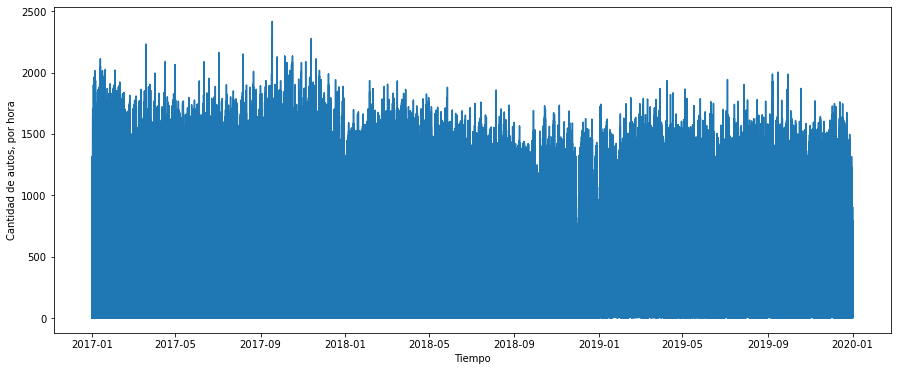

In [14]:
#Graficamos nuestros datos, tal como están
plt.figure(figsize = (15,6))
plt.plot(dataset.fecha, dataset.cantidad_pasos)
plt.xlabel('Tiempo')
plt.ylabel('Cantidad de autos, por hora')
plt.show()

No se puede observar un patron en los datos para poder hayar una autocorrelación y pooder implemnetar un modelo

In [15]:
#Resampleamos nuestros datos para agrupar por dia, y asi tal vez lograr una visualización mas amigable
diario = dataset.resample('D', on = 'fecha').sum()
print(diario.shape)
diario.head()

(1095, 1)


,cantidad_pasos
fecha,
2017-01-01,31183
2017-01-02,51568
2017-01-03,51093
2017-01-04,53332
2017-01-05,56486


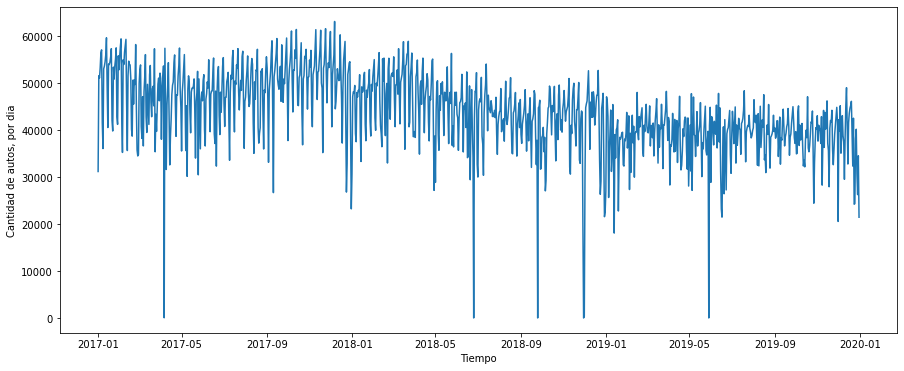

In [16]:
plt.figure(figsize = (15,6))
plt.plot(diario.index, diario.cantidad_pasos)
plt.xlabel('Tiempo')
plt.ylabel('Cantidad de autos, por dia')
plt.show()

Se puede observar que los datos en el tiempo cuenta con valores atípicos bajo de 30.000 de autos por día 

In [17]:
semanal = dataset.resample('W', on = 'fecha').mean()

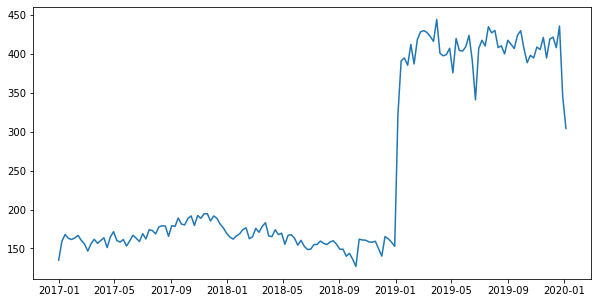

In [18]:
plt.figure(figsize=(10,5))
plt.plot(semanal.index,semanal.cantidad_pasos)
plt.show()

Semanal tiene mucho ruido en comparación a semanal

In [19]:
mensual = dataset.resample('M', on = 'fecha').sum()
print(mensual.shape)
mensual.head()

(36, 1)


,cantidad_pasos
fecha,
2017-01-31,1565260
2017-02-28,1363113
2017-03-31,1451214
2017-04-30,1373985
2017-05-31,1407136


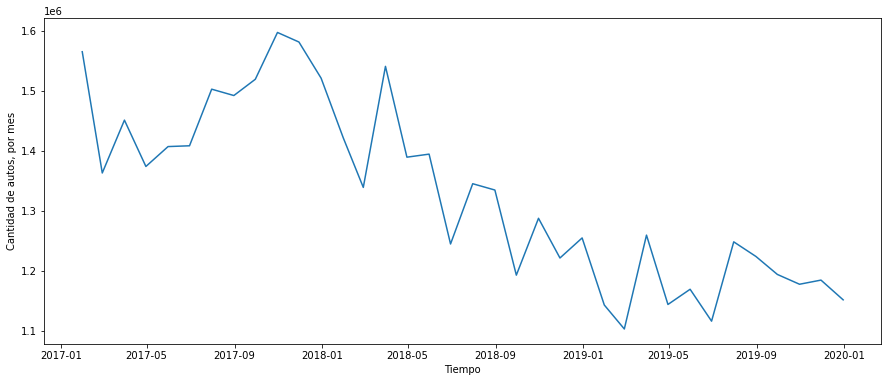

In [20]:
plt.figure(figsize = (15,6))
plt.plot(mensual.index, mensual.cantidad_pasos)
plt.xlabel('Tiempo')
plt.ylabel('Cantidad de autos, por mes')
plt.show()

Cambiando a una periosidad mensual no se encuentran patrones definidos y los datos contarian con mucho ruido para implementar un modelo.

Se propone usar la periosidad diaria, teniendo encuenta que tiene valores atipicos, así que se propondria eliminar y polarizar para llevar un mejor desempeño de modelos predictores en el tiempo

### Análisis Exploratorio de Datos

In [21]:
dataset.head(2)

,dia,sentido,tipo_vehiculo,cantidad_pasos,fecha
0,Domingo,Provincia,Pesado,1,2017-01-01
1,Domingo,Provincia,Liviano,9,2017-01-01


In [22]:
dataset.dtypes

dia                       object
sentido                   object
tipo_vehiculo             object
cantidad_pasos             int64
fecha             datetime64[ns]
dtype: object

In [23]:
dataset.describe()

,cantidad_pasos
count,238869.000000
mean,200.384232
std,403.246904
min,1.000000
25%,2.000000
50%,11.000000
75%,104.000000
max,2416.000000


* Se propone revisar los valores maximos y minimos de la variable pasos ya que podrían ser valores atípicos.  
* La desviasíon de estandar de los datos nos informa que hay bastante bolatilidad en niestros datos ya que la presenta bastante elevada.

C:\Users\Usuario\miniconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


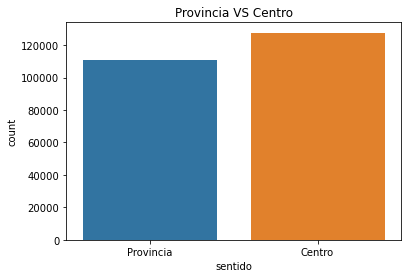

In [24]:
import seaborn as sns
sns.countplot(dataset.sentido)
plt.title('Provincia VS Centro')
plt.show()

Hay más registros en centro que en provincia

C:\Users\Usuario\miniconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


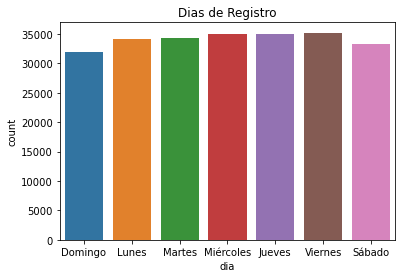

In [25]:
sns.countplot(dataset.dia)
plt.title('Dias de Registro')
plt.show()

Los días domingo y sabado son aquellos que nos se registran salida de vehículos

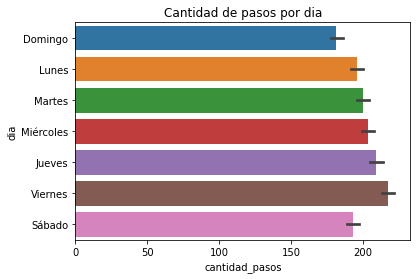

In [26]:
sns.barplot(x = 'cantidad_pasos',y = 'dia',data = dataset  )
plt.title('Cantidad de pasos por dia')
plt.show()

el viernes son los días que hay mayores pasos y el domingo es el que hay menos cantidad de pasos

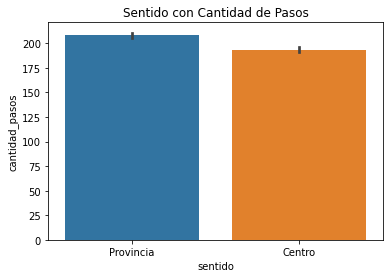

In [27]:
sns.barplot(x = 'sentido',y = 'cantidad_pasos',data = dataset  )
plt.title('Sentido con Cantidad de Pasos')
plt.show()

salen más automoviles en provincia que en centro

In [28]:
l = dataset[dataset.tipo_vehiculo == 'Liviano']
l

,dia,sentido,tipo_vehiculo,cantidad_pasos,fecha
1,Domingo,Provincia,Liviano,9,2017-01-01 00:00:00
2,Domingo,Provincia,Liviano,644,2017-01-01 00:00:00
6,Domingo,Centro,Liviano,23,2017-01-01 00:00:00
11,Domingo,Centro,Liviano,857,2017-01-01 00:00:00
12,Domingo,Centro,Liviano,1,2017-01-01 01:00:00
...,...,...,...,...,...
238862,Martes,Centro,Liviano,799,2019-12-31 21:00:00
238864,Martes,Provincia,Liviano,556,2019-12-31 22:00:00
238866,Martes,Centro,Liviano,580,2019-12-31 22:00:00
238867,Martes,Centro,Liviano,214,2019-12-31 23:00:00


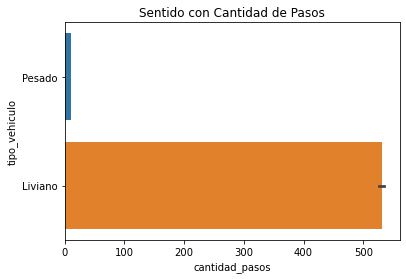

In [29]:
sns.barplot(x = 'cantidad_pasos',y = 'tipo_vehiculo',data = dataset  )
plt.title('Sentido con Cantidad de Pasos')
plt.show()

El dia que mas pasaron fue 500 vehiculos livianos

C:\Users\Usuario\miniconda3\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


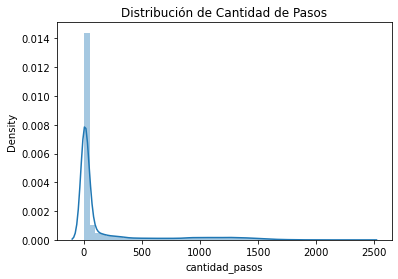

Promedio de cantidad de pasos: 200.38423152439202
Asimetría de cantidad de pasos: 2.1676568561443323
Varianza de cantidad de pasos: 162608.06531576623
Curtosos de cantidad de pasos: 3.4853965257990898


In [30]:
sns.distplot(dataset.cantidad_pasos)
plt.title('Distribución de Cantidad de Pasos')
plt.show()
print('Promedio de cantidad de pasos:', dataset.cantidad_pasos.mean())
print('Asimetría de cantidad de pasos:', dataset.cantidad_pasos.skew())
print('Varianza de cantidad de pasos:',dataset.cantidad_pasos.var())
print('Curtosos de cantidad de pasos:',dataset.cantidad_pasos.kurt())

Como se suponía tiene valores atipicos en la parte derecha por ende tiene una asimetria positiva y una curtosis leptocurtica.

C:\Users\Usuario\miniconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


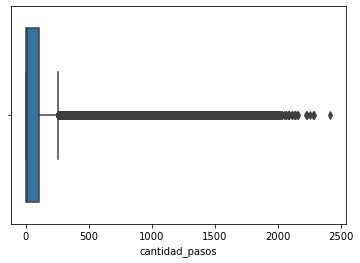

In [31]:
sns.boxplot(dataset.cantidad_pasos)
plt.show()

Como lo mostraba la distribución de probabilida, contamos con valores atipicos en la derecha

### Revisión de los datos

In [32]:
dataset.dtypes

dia                       object
sentido                   object
tipo_vehiculo             object
cantidad_pasos             int64
fecha             datetime64[ns]
dtype: object

In [33]:
dataset.isnull().sum()

dia               0
sentido           0
tipo_vehiculo     0
cantidad_pasos    0
fecha             0
dtype: int64

No se cuenta con valores nulos

## Preguntas generadas

* ¿ Los viernes en provincia cuantos vehiculos salen?  
* ¿ De los autos pesados que dias salen más a la semana?
* ¿ De los autos pesados en que sentido salen más?

In [34]:
dataset.head(2)

,dia,sentido,tipo_vehiculo,cantidad_pasos,fecha
0,Domingo,Provincia,Pesado,1,2017-01-01
1,Domingo,Provincia,Liviano,9,2017-01-01


In [36]:
pd.unique(dataset.dia)

array(['Domingo', 'Lunes', 'Martes', 'Miércoles', 'Jueves', 'Viernes',
       'Sábado'], dtype=object)

In [37]:
q_1 = dataset[dataset.dia == 'Viernes']
q_1 = q_1[q_1.sentido == 'Provincia']
q_1.head(2)

,dia,sentido,tipo_vehiculo,cantidad_pasos,fecha
1499,Viernes,Provincia,Liviano,24,2017-01-06
1500,Viernes,Provincia,Liviano,474,2017-01-06


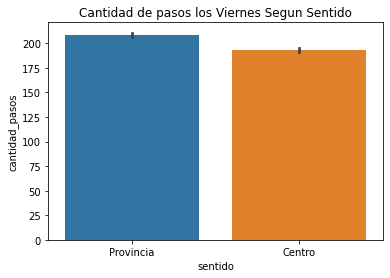

numero maximo de pasos en provincia es:  2018
total de pasos en provicia los viernes: 3672006


In [38]:
sns.barplot(x ='sentido',y = 'cantidad_pasos',data =dataset )
plt.title('Cantidad de pasos los Viernes Segun Sentido')
plt.show()
print('numero maximo de pasos en provincia es: ',q_1.cantidad_pasos.max())
print('total de pasos en provicia los viernes:', q_1.cantidad_pasos.sum())

In [39]:
f_1 = q_1[q_1.cantidad_pasos == 2018]
f_1

,dia,sentido,tipo_vehiculo,cantidad_pasos,fecha
82503,Viernes,Provincia,Liviano,2018,2017-10-13 15:00:00
94004,Viernes,Provincia,Liviano,2018,2017-11-24 15:00:00


Aquells días que salieron más, fue en el 2017 en ocutbre y noviembre

C:\Users\Usuario\miniconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


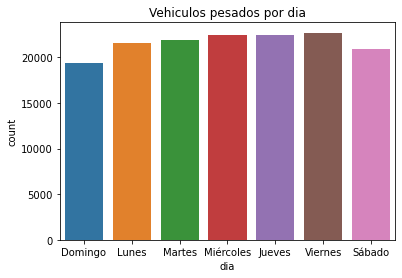

Número de salidas viernes de vehiculos pesados 22710
Salidas totales el viernes de 


In [40]:
q_2 = dataset[dataset.tipo_vehiculo == 'Pesado']
sns.countplot(q_2.dia)
plt.title('Vehiculos pesados por dia')
plt.show()
print('Número de salidas viernes de vehiculos pesados',q_2[q_2.dia == 'Viernes'].dia.count())
print('Salidas totales el viernes de ')

C:\Users\Usuario\miniconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


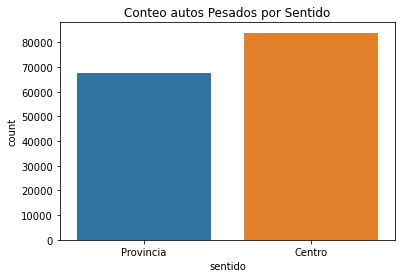

Hay más registros en centro que en provincia en autos pesados
Total de pasos en sentido centro: 888204


In [41]:
sns.countplot(q_2.sentido)
plt.title('Conteo autos Pesados por Sentido')
plt.show()
print('Hay más registros en centro que en provincia en autos pesados')
q_2_1 = q_2[q_2.sentido == 'Centro']
print('Total de pasos en sentido centro:',q_2_1.cantidad_pasos.sum())

In [42]:
print('Máximo de cantidad de pasos en snetido',q_2_1.cantidad_pasos.max())

Máximo de cantidad de pasos en snetido 109


In [43]:
print(q_2_1[q_2_1.cantidad_pasos == 109])
print('En centro la mayor cantidad de pasos se hizo el 13 de enero del 2017')

          dia sentido tipo_vehiculo  cantidad_pasos               fecha
3767  Viernes  Centro        Pesado             109 2017-01-13 08:00:00
En centro la mayor cantidad de pasos se hizo el 13 de enero del 2017


### Eliminar valores atípicos

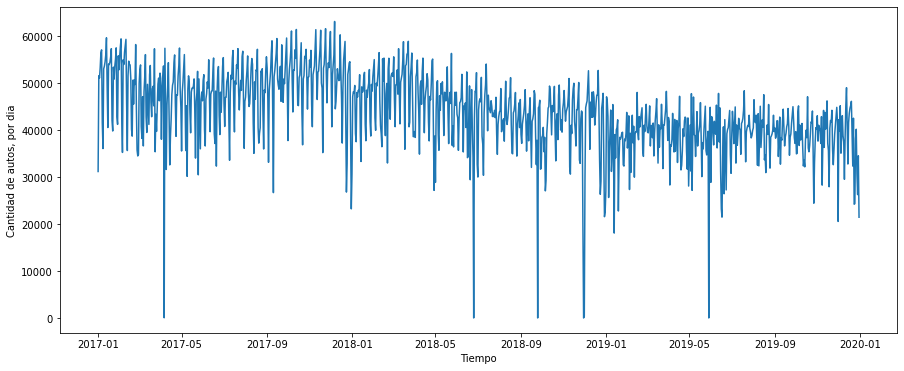

In [44]:
plt.figure(figsize = (15,6))
plt.plot(diario.index, diario.cantidad_pasos)
plt.xlabel('Tiempo')
plt.ylabel('Cantidad de autos, por dia')
plt.show()

In [45]:
diario.cantidad_pasos[diario.cantidad_pasos < 30000] = np.nan

In [46]:
diario = diario.interpolate()

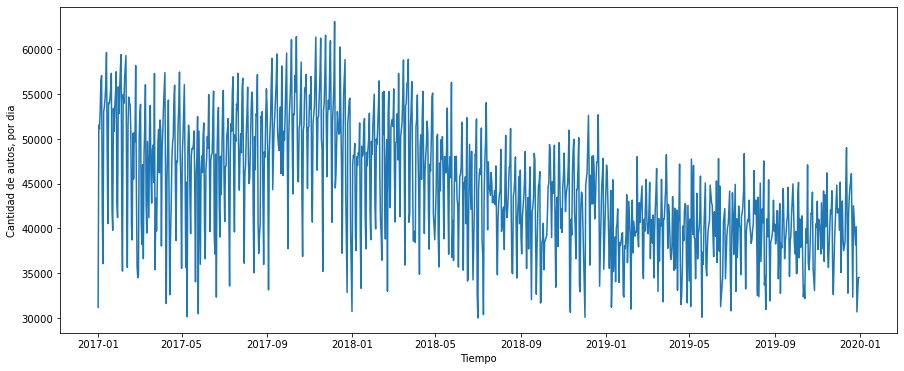

In [47]:
plt.figure(figsize = (15,6))
plt.plot(diario.index, diario.cantidad_pasos)
plt.xlabel('Tiempo')
plt.ylabel('Cantidad de autos, por dia')
plt.show()

Al interpolar los datos menores a 30000 se reducen los valores atípicos 

## Tendencia y media movil

In [48]:
ventana = int(365*1/7)# ventana de fecha
diario_promedio_tendencia = diario.cantidad_pasos.rolling(window=ventana, center = True).mean()# promedio de la tendencia

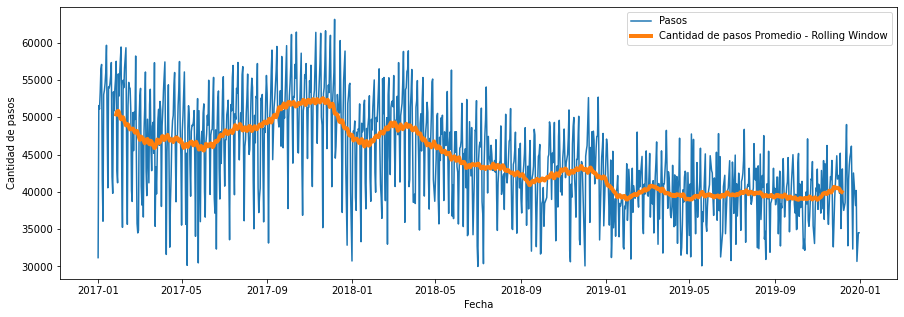

In [49]:
plt.figure(figsize = (15,5))
plt.plot(diario.index, diario.cantidad_pasos, label = 'Pasos')
plt.plot(diario_promedio_tendencia, lw = 4, label = 'Cantidad de pasos Promedio - Rolling Window')
plt.xlabel('Fecha')
plt.ylabel('Cantidad de pasos')
plt.legend()
plt.show()

Se pone una media movil para determinar una tendencia, se observa que los pasos han disminuido a pasar el tiempo

Se propone hacer un modelo de regresión para observar un linea de tendencia 

In [50]:
diario

,cantidad_pasos
fecha,
2017-01-01,31183.0
2017-01-02,51568.0
2017-01-03,51093.0
2017-01-04,53332.0
2017-01-05,56486.0
...,...
2019-12-27,40182.0
2019-12-28,30681.0
2019-12-29,32602.0


In [51]:
diario['fecha_numeros']= diario.index.map(datetime.datetime.toordinal)
diario.head()

,cantidad_pasos,fecha_numeros
fecha,,
2017-01-01,31183.0,736330
2017-01-02,51568.0,736331
2017-01-03,51093.0,736332
2017-01-04,53332.0,736333
2017-01-05,56486.0,736334


In [52]:
from sklearn.linear_model import LinearRegression
lr = LinearRegression()
lr.fit(diario.fecha_numeros.values.reshape(-1, 1), diario.cantidad_pasos)

LinearRegression()

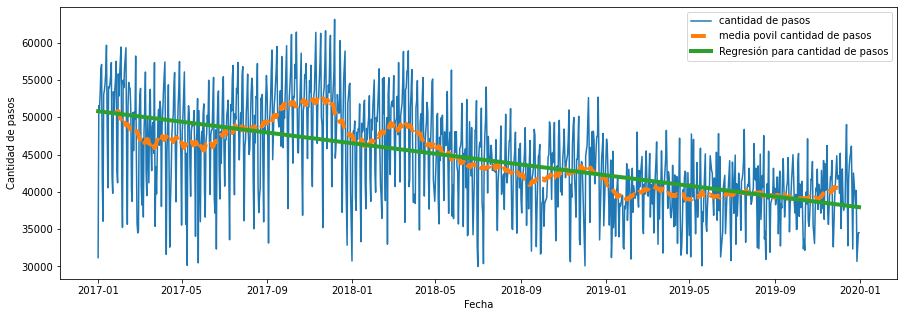

In [53]:
plt.figure(figsize = (15,5))
plt.plot(diario.index, diario.cantidad_pasos,label = 'cantidad de pasos')
plt.plot(diario_promedio_tendencia, ls = '--', lw = 4, label = 'media povil cantidad de pasos')
plt.plot(diario.index, lr.predict(diario.fecha_numeros.values.reshape(-1, 1)), lw = 4, label = 'Regresión para cantidad de pasos')
# plt.xlim(datetime.date(1985,1,1), datetime.date(2018,1,1))
# plt.ylim([0,30])
plt.xlabel('Fecha')
plt.ylabel('Cantidad de pasos')
plt.legend()
plt.show()

Como se esperaba, los datos tienen una tendencia negativa a lo largo del tiempo

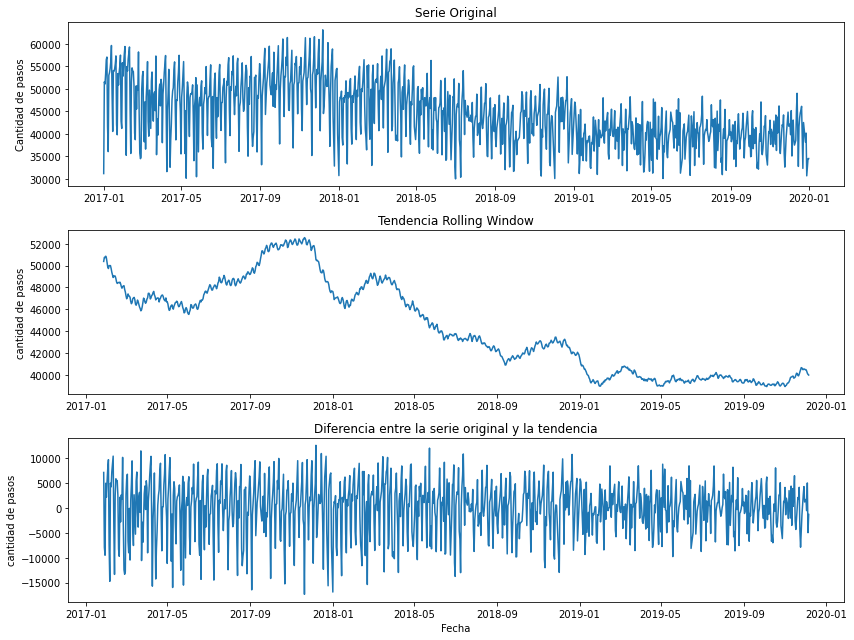

In [54]:
plt.figure(figsize = (12,9))

plt.subplot(3,1,1)
plt.title('Serie Original')
plt.plot(diario.index, diario.cantidad_pasos)
plt.ylabel('Cantidad de pasos')

plt.subplot(3,1,2)
plt.title('Tendencia Rolling Window')# por media movil
plt.plot(diario_promedio_tendencia)
plt.ylabel('cantidad de pasos')

plt.subplot(3,1,3)
plt.title('Diferencia entre la serie original y la tendencia')
plt.plot(diario.index, diario.cantidad_pasos - diario_promedio_tendencia) # componente estacional y ruido blanco
plt.xlabel('Fecha')
plt.ylabel('cantidad de pasos')

plt.tight_layout()
plt.show()

* En el primer gráfico se encuentra la serie de datos originales
* la segunda podemos ver la tendencia que han tenido nuestros datos a lo largo del tiempo.
* La serie de tiempo se compone de una tendencia, estacionalidad y ruido blanco. la diferencia entre tendencia y la serie orignial que nos daría el ruido que tiene la serie de tiempo.

## Descomposición estacional

Puede pensar en una serie de tiempo como compuesta de componentes de tendencia, estacionales y residuales. Esta puede ser una buena forma de pensar en los datos cuando se va a modelar. Si conoce el período de la serie temporal, puede descomponerlo en estos componentes

In [55]:
from statsmodels.tsa.seasonal import seasonal_decompose # descomposición utilizando medias moviles

result = seasonal_decompose(diario.cantidad_pasos, model='additive')

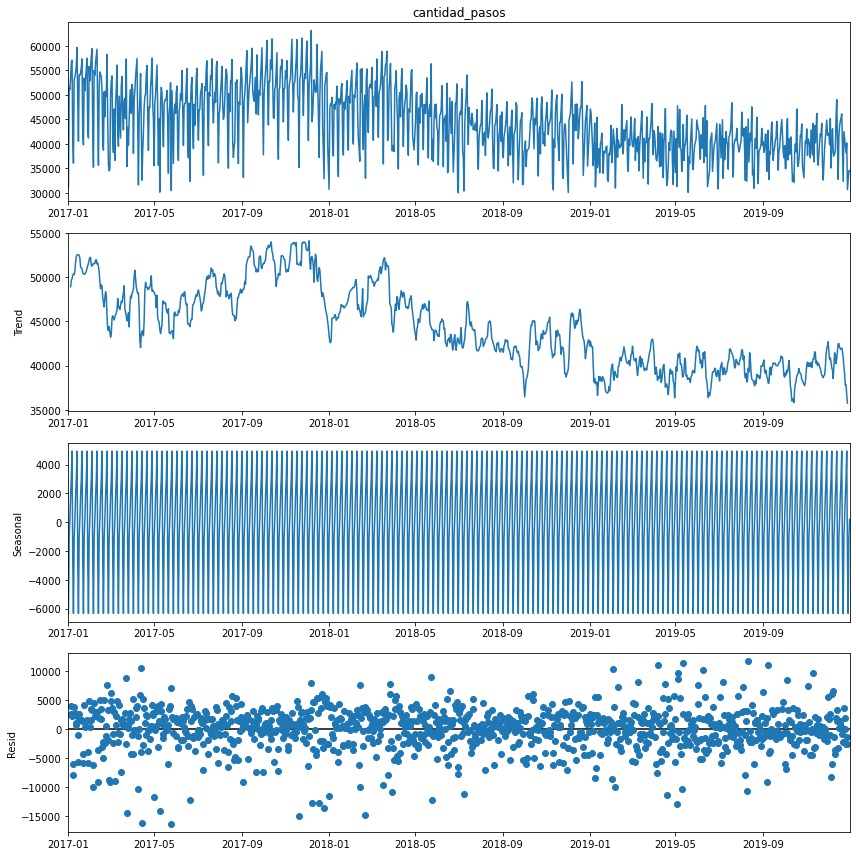

In [56]:
plt.rcParams['figure.figsize'] = [12,12]
result.plot()
plt.show()

Con la descomposición de media movil podemos encontrar lo siguiente:  
* La tendencia que tienen los datos a lo largo del tiempo, se observa que es bastante bolatil pero tiene una tendencia bajista.
* En el siguiente grafico encontramos la estacionalidad, que es con la que se construirá un modelo Sarima, ya que este aprende de la estacionalidad que tengan los datos en el tiempo.
* Se encuentran los residuos que oxilan en 0, lo cual es buen aporte al modelo Sarima

## Primer Análisis usando prophet

Prophet es un procedimiento para pronosticar datos de series de tiempo basado en un modelo aditivo en el que las tendencias no lineales se ajustan a la estacionalidad anual, semanal y diaria, además de los efectos de las vacaciones. Funciona mejor con series de tiempo que tienen fuertes efectos estacionales y varias temporadas de datos históricos. Prophet es robusto ante los datos faltantes y los cambios en la tendencia, y normalmente maneja bien los valores atípicos.

In [57]:
semanal.head()

,cantidad_pasos
fecha,
2017-01-01,134.991342
2017-01-08,159.344654
2017-01-15,168.002293
2017-01-22,162.963047
2017-01-29,161.540319


Cambiamos el nombre de los features para que el modelo de prophet las pueda entender

In [58]:
tms_p = {'ds':diario.index,'y':diario['cantidad_pasos']}
tms_p = pd.DataFrame(tms_p)
tms_p = tms_p.reset_index()
tms_p.drop(columns=['fecha'],inplace= True)
tms_p.head()

,ds,y
0,2017-01-01,31183.0
1,2017-01-02,51568.0
2,2017-01-03,51093.0
3,2017-01-04,53332.0
4,2017-01-05,56486.0


Ajustamos el modelo creando una instancia de un nuevo objeto Prophet. Cualquier configuración del procedimiento de previsión se pasa al constructor. Luego llama al método fit y pasa el marco de datos histórico

In [59]:
! pip install prophet

In [60]:
from prophet import Prophet
m = Prophet()
m.fit(tms_p)

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


A continuación, se realizan predicciones en un marco de datos con una columna que dscontiene las fechas para las que se realizará una predicción. Puede obtener un marco de datos adecuado que se extienda en el futuro un número específico de días utilizando el método auxiliar Prophet.make_future_dataframe. De forma predeterminada, también incluirá las fechas del historial, por lo que también veremos el ajuste del modelo.

In [61]:
future = m.make_future_dataframe(periods=365)
future.head()

,ds
0,2017-01-01
1,2017-01-02
2,2017-01-03
3,2017-01-04
4,2017-01-05


El predictmétodo asignará a cada fila futureun valor predicho que nombra yhat. Si pasa las fechas históricas, proporcionará un ajuste en la muestra. El forecastobjeto aquí es un nuevo marco de datos que incluye una columna yhatcon el pronóstico, así como columnas para componentes e intervalos de incertidumbre.

In [62]:
forecast = m.predict(future)
forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].head()

,ds,yhat,yhat_lower,yhat_upper
0,2017-01-01,41355.084436,36011.830436,46491.159566
1,2017-01-02,46543.683699,41282.793115,51912.873299
2,2017-01-03,47642.512021,42387.859380,52847.678235
3,2017-01-04,49133.888002,43691.461719,54485.808651
4,2017-01-05,50235.290792,44681.198157,55649.977110


Puede trazar el pronóstico llamando al Prophet.plotmétodo y pasando su marco de datos de pronóstico.

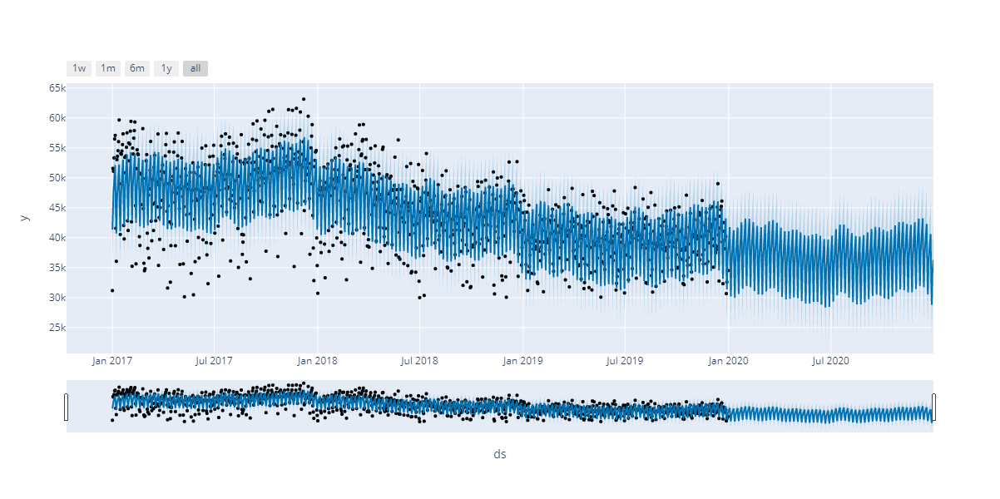

In [63]:
from prophet.plot import plot_plotly, plot_components_plotly

plot_plotly(m, forecast)

Los valores negros son los valores reales y lo que está en el rango azul son los valores predichos.  
Se observa que los datos predichos estan dentro del intervalo de confianza lo cual lo hace un buen modelo

 De forma predeterminada, verá la tendencia, la estacionalidad anual y la estacionalidad semanal de la serie temporal

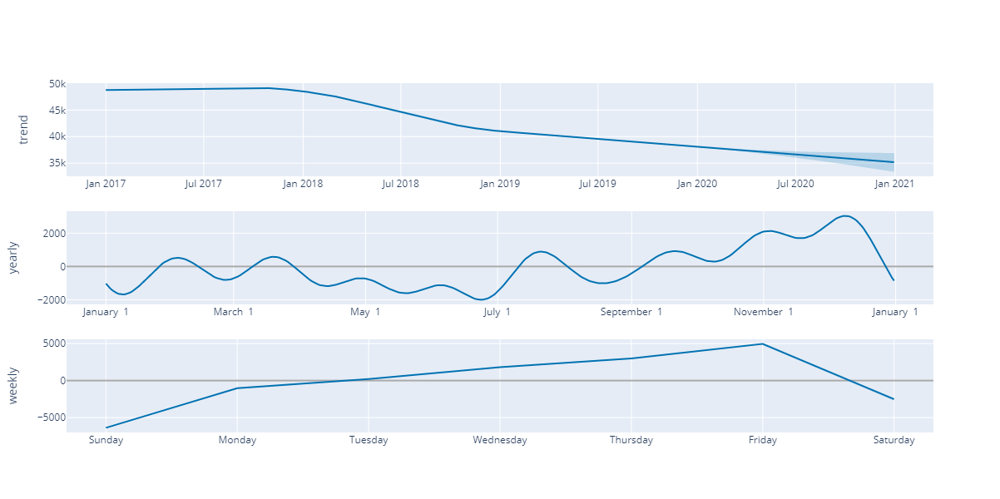

In [64]:
plot_components_plotly(m, forecast)

## Puntos de cambio de tendencia

Prophet detecta los puntos de cambio especificando primero un gran número de puntos de cambio potenciales en los que se permite que cambie la tasa. Luego, coloca un previo escaso en las magnitudes de los cambios de tasa (equivalente a la regularización L1); esto esencialmente significa que Prophet tiene una gran cantidad de lugares posibles donde la tasa puede cambiar, pero usará la menor cantidad posible de ellos. Considere el pronóstico de Peyton Manning del Inicio rápido. De forma predeterminada, Prophet especifica 25 puntos de cambio potenciales que se colocan uniformemente en el primer 80% de la serie de tiempo. Las líneas verticales en esta figura indican dónde se colocaron los puntos de cambio potenciales:

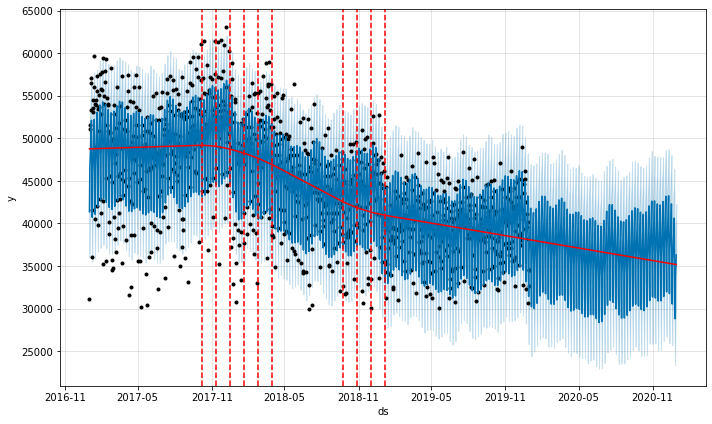

In [65]:
from prophet.plot import add_changepoints_to_plot
fig = m.plot(forecast)
a = add_changepoints_to_plot(fig.gca(), m, forecast)


Por defecto, los puntos de cambio solo se infieren para el primer 80% de la serie de tiempo con el fin de tener suficiente pista para proyectar la tendencia hacia adelante y evitar fluctuaciones de sobreajuste al final de la serie de tiempo.

Aquellas lineas que se ven son aque llos puntos que cambiaron la tendencia en el modelo

## Prueba del modelo

Prophet incluye una funcionalidad para la validación cruzada de series de tiempo para medir el error de pronóstico utilizando datos históricos. Esto se hace seleccionando puntos de corte en el historial, y para cada uno de ellos ajustando el modelo usando datos solo hasta ese punto de corte. Luego podemos comparar los valores pronosticados con los valores reales.

Aquí realizamos una validación cruzada para evaluar el rendimiento de la predicción en un horizonte de 600 días, comenzando con 450 días de datos de entrenamiento en el primer límite y luego haciendo predicciones cada 50 días. En esta serie de tiempo de 3 años

In [66]:
from prophet.diagnostics import cross_validation
df_cv = cross_validation(m, initial='350 days', period='50 days', horizon = '700 days')

INFO:prophet:Making 1 forecasts with cutoffs between 2018-01-30 00:00:00 and 2018-01-30 00:00:00


In [68]:
df_cv.head()

,ds,yhat,yhat_lower,yhat_upper,y,cutoff
0,2018-01-31,50536.650716,45434.319769,55254.581923,51377.0,2018-01-30
1,2018-02-01,51973.194021,46865.321676,56563.532162,53306.0,2018-01-30
2,2018-02-02,53952.029718,49025.964669,58842.354192,55008.0,2018-01-30
3,2018-02-03,43913.437168,39092.588124,48713.330956,42606.0,2018-01-30
4,2018-02-04,38197.233300,33496.964030,43050.873050,39956.0,2018-01-30


En función de la distancia desde el límite (qué tan lejos en el futuro estaba la predicción). Las estadísticas calculadas son el error cuadrático medio (MSE), el error cuadrático medio medio (RMSE), el error absoluto medio (MAE), el error porcentual absoluto medio (MAPE), el error porcentual absoluto medio (MDAPE) y la cobertura de las estimaciones yhat_lowery yhat_upper. Estos se calculan en una ventana móvil de las predicciones df_cvdespués de ordenarlas por horizonte ( dsmenos cutoff)

In [69]:
from prophet.diagnostics import performance_metrics
df_p = performance_metrics(df_cv)
df_p.head()

,horizon,mse,rmse,mae,mape,mdape,smape,coverage
0,70 days,5.800021e+07,7615.786707,6715.649798,0.138625,0.151224,0.148226,0.342857
1,71 days,5.799399e+07,7615.378439,6711.080235,0.138555,0.151224,0.148155,0.342857
2,72 days,5.848893e+07,7647.805693,6778.255816,0.139840,0.151224,0.149536,0.328571
3,73 days,5.913924e+07,7690.204095,6860.729059,0.141329,0.151224,0.151139,0.314286
4,74 days,6.009019e+07,7751.786471,6960.093409,0.143410,0.154012,0.153470,0.300000


Se observan las metricas que hizo el pronostico con las funciones de costo por dia.
* Los errores en las ventanas de tiempo se encuentran hasta de un 65%

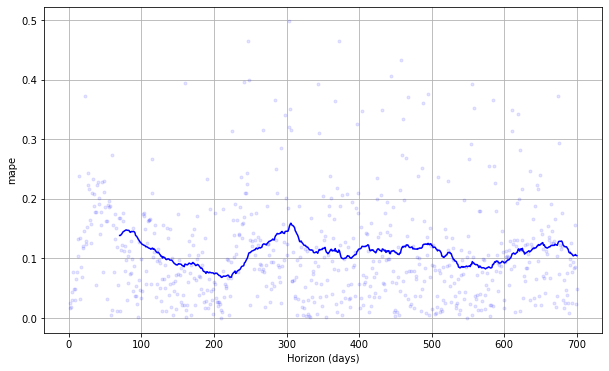

In [71]:
from prophet.plot import plot_cross_validation_metric
fig = plot_cross_validation_metric(df_cv, metric='mape')


Se observa que los errores se aprociman casi a un 10%, se propone cambiar hiperparametros o usar otro modelo

### Metodología Box Jenkins y Modelo 2

**Decidir acerca de la transformación de la serie para que sea estacionaria** 
> Hacer gráfica de la serie  
Analizar los correlogramas ( Función de autocorrelación y autocorrelación parcial)  
Test de Dicky-Fuller

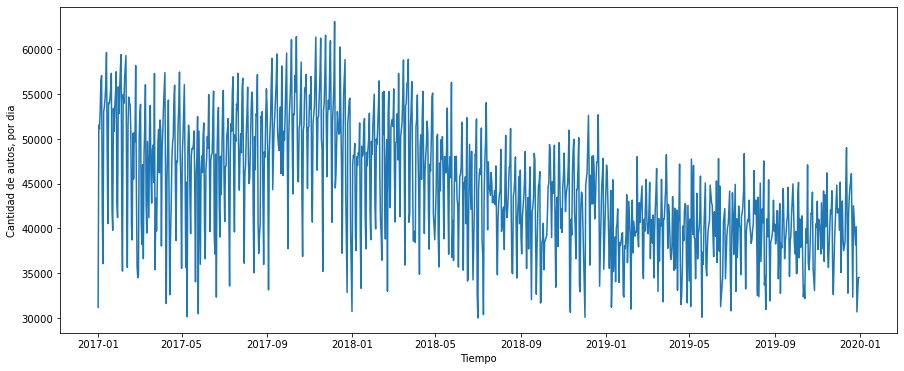

In [72]:
plt.figure(figsize = (15,6))
plt.plot(diario.index, diario.cantidad_pasos)
plt.xlabel('Tiempo')
plt.ylabel('Cantidad de autos, por dia')
plt.show()

C:\Users\Usuario\miniconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



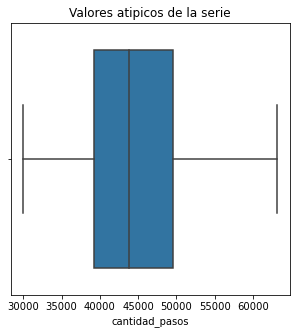

In [73]:
plt.figure(figsize=(5,5))
sns.boxplot(diario.cantidad_pasos)
plt.title('Valores atipicos de la serie')
plt.show()

Existen formas para transformar una serie estacional las cuales se aplicaran el modelo:  
+ La diferencia (Resta la variable z = (yt -(yt-1))
+ Transformación logaritmica  
+ La diferencia del logaritmo  
Sarima predice todo lo que de forma lineal, se puede utilizar el pasado para explicar el futuro

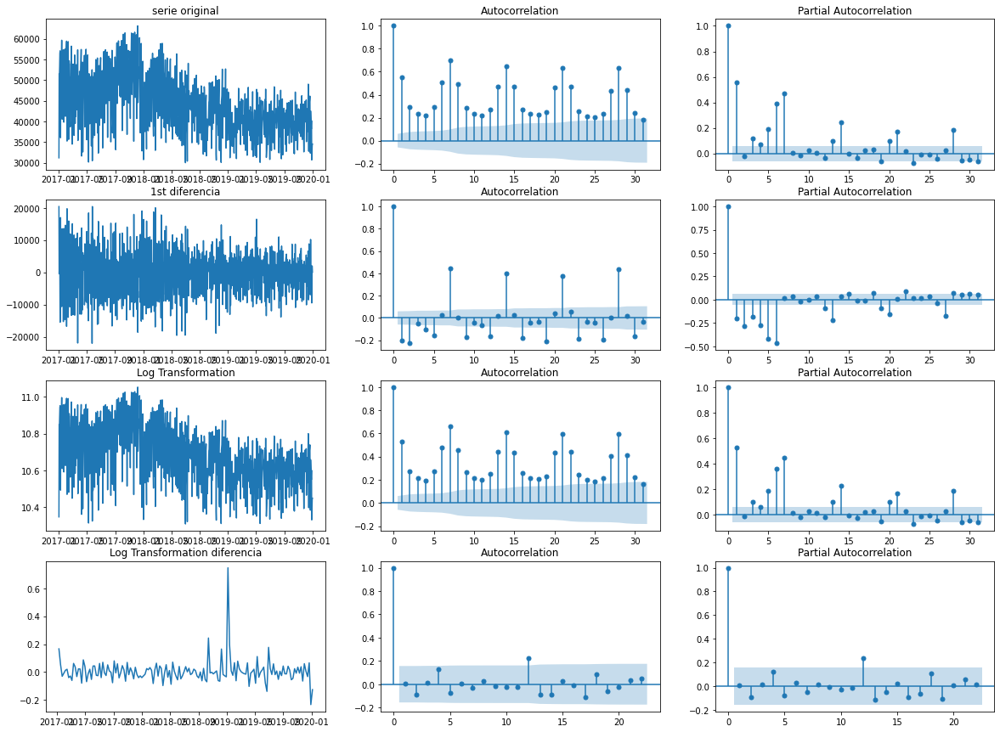

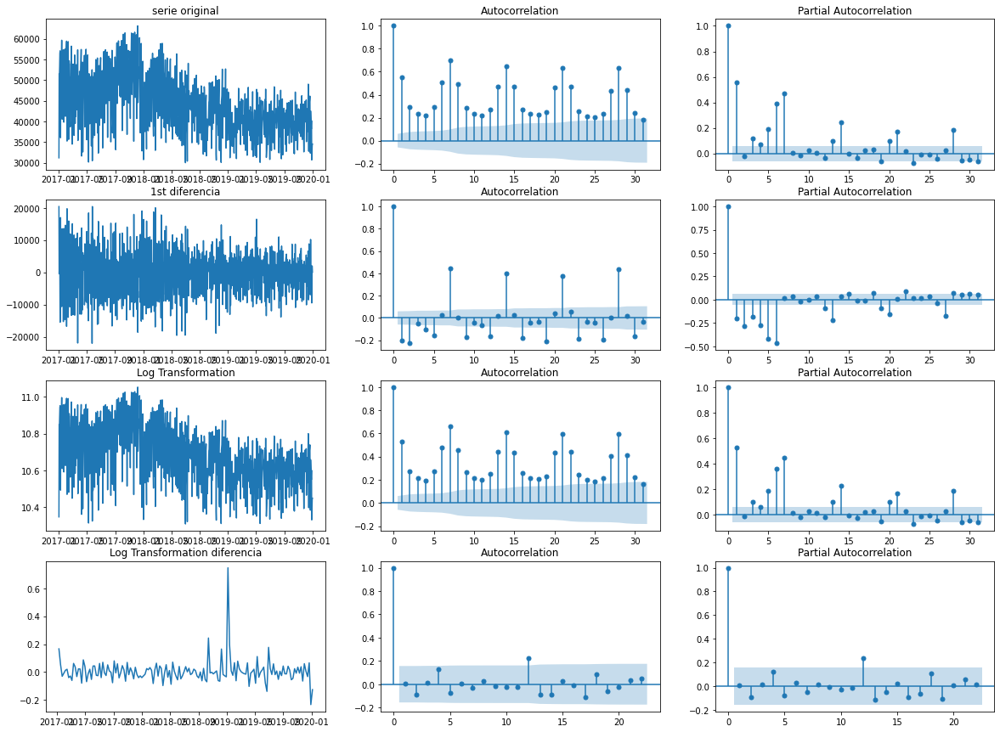

In [74]:
from statsmodels.graphics.tsaplots import plot_acf,plot_pacf
fig, axes = plt.subplots(4,3,figsize = (20,15))
axes[0,0].plot(diario.cantidad_pasos);axes[0,0].set_title('serie original')
plot_acf(diario.cantidad_pasos, ax = axes[0,1])
plot_pacf(diario.cantidad_pasos, ax = axes[0,2])

axes[1,0].plot(diario.cantidad_pasos.diff()); axes[1,0].set_title('1st diferencia')
plot_acf(diario.cantidad_pasos.diff().dropna(), ax = axes[1,1])
plot_pacf(diario.cantidad_pasos.diff().dropna(), ax = axes[1,2])

axes[2,0].plot(np.log(diario.cantidad_pasos)); axes[2,0].set_title('Log Transformation')
plot_acf(np.log(diario.cantidad_pasos).dropna(),ax = axes[2,1])
plot_pacf(np.log(diario.cantidad_pasos).dropna(),ax = axes[2,2])

axes[3,0].plot(np.log(semanal.cantidad_pasos).diff()); axes[3,0].set_title('Log Transformation diferencia')
plot_acf(np.log(semanal.cantidad_pasos).diff().dropna(),ax = axes[3,1])
plot_pacf(np.log(semanal.cantidad_pasos).diff().dropna(),ax = axes[3,2])

Necesitamos hayar el parametro P, que es de la parte regresova y el parametreo Q de media movil, para eso tenemos que buscar los retardos que más se salgan del intervalo de confianza, ya que permite saber cual es el mejor periodo de tiempo para explicar el futuro.  
para los procesosa autorregresivos se usa la autocorrelación parcial y procesos de media movi la autocorrelación.  
Lo que diferencia Arma de Arima son las diferencias que se le efectuan, para luego aplicar el modelo arma

In [75]:
from pmdarima.arima.utils import ndiffs
print(ndiffs(diario.cantidad_pasos,test='adf'))
# numero de diferencias que necesito con el test de diky fuller

0


In [76]:
diffClose = diario.cantidad_pasos.diff()
print(ndiffs(diffClose[1:],test = 'adf'))

0


Aunque el método dicky close nos dice que no se necesitan diferencias, se pretende optar por una ya que si observamos la diferencia, esta oscila en el rango 0 lo cual hace que sea un mejor odelo

## Modelo arima que más se ajusta a las autocorrelaciones encontradas

Se escoje el parametro 7 ya que es el que más se sale del intervalo de confianza de la autocorrelación

In [77]:
from statsmodels.tsa.arima.model import ARIMA
model = ARIMA(diario.cantidad_pasos, order=(6,1,7))
# el orden de los parameteos es p d q
model_fit = model.fit()
print(model_fit.summary())

C:\Users\Usuario\miniconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:966: UserWarning:

Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.

C:\Users\Usuario\miniconda3\lib\site-packages\statsmodels\base\model.py:566: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



                               SARIMAX Results                                
Dep. Variable:         cantidad_pasos   No. Observations:                 1095
Model:                 ARIMA(6, 1, 7)   Log Likelihood              -10704.243
Date:                Mon, 07 Jun 2021   AIC                          21436.486
Time:                        13:35:15   BIC                          21506.452
Sample:                    01-01-2017   HQIC                         21462.962
                         - 12-31-2019                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.9910      0.025    -39.352      0.000      -1.040      -0.942
ar.L2         -0.9139      0.028    -32.219      0.000      -0.969      -0.858
ar.L3         -0.9522      0.013    -74.615      0.0

* Se observa que en el reporte el valor abosuto del z  es mayor que 1.96 lo cual hace que sean relevantes los valores ya que hablamos de dos distribuciones estandar. El L5 y el L6 son los menos relevantes
* P>|z| la mayoria de valores son menores a 0.05 lo cual hace que sea un parametro relevante. los valores que no son relevantes son el ma.L6 y ma L5  
* El rango del intervalo de confianza desde 0.025 y 0.975 y solo el parametro L6 y L5 son relevantes ya que esta dentro de su rango el 0  

## Residuos 

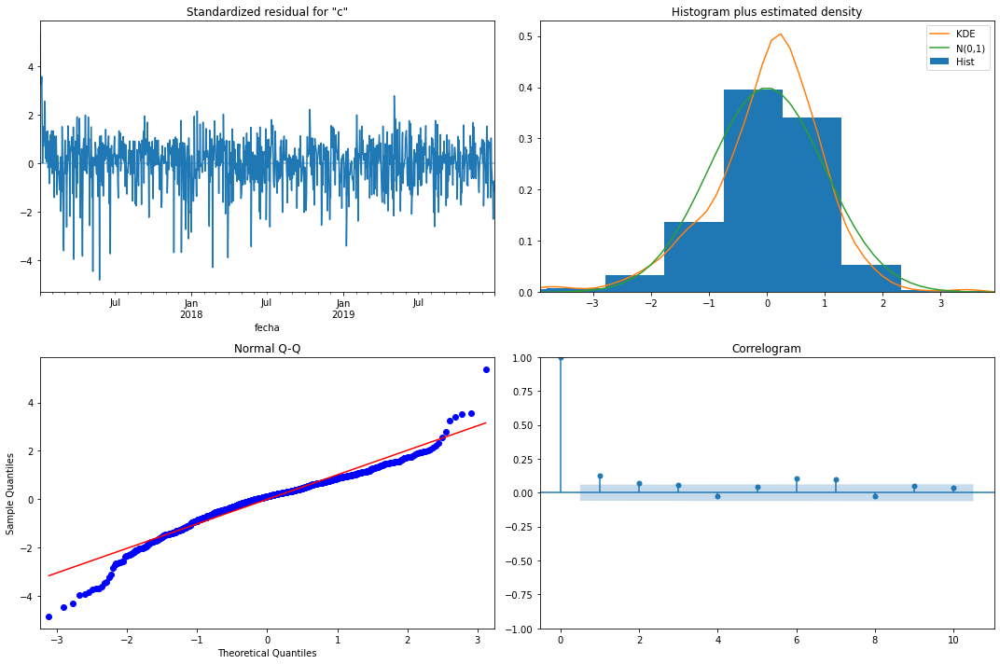

In [78]:
model_fit.plot_diagnostics(figsize=(15,10))
plt.tight_layout()
plt.show()

* En el primer gráfico buscamos ruido blanco, aunque no tenga media 0 y la varianza no sea constante pero oscila en 0 
* En el segundo vemos que los errores no se estan distribuyendo normalmente ya que no tiene media 0 como la linea verde
* En el mayor de los casos los puntos azules (Errores) se ajustan a la linea roja
* Hay variables que se encuentran dentro de el intervalo de confianza

## Pronostico

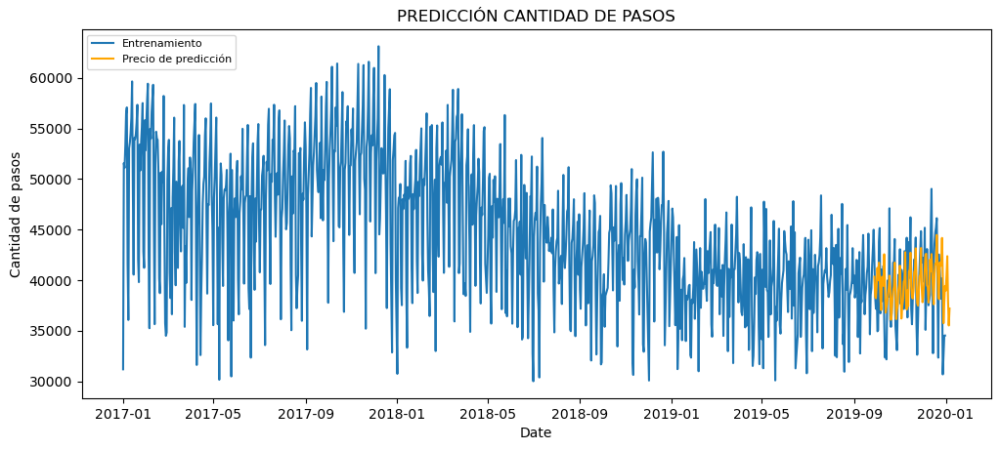

In [79]:
fc = model_fit.predict(start = 1000,end = 1100)
fc_series = pd.Series(fc)
plt.figure(figsize=(12,5),dpi = 100)
plt.plot(diario.cantidad_pasos,label = 'Entrenamiento')
plt.plot(fc_series, color = 'orange', label = 'Precio de predicción')
plt.title('PREDICCIÓN CANTIDAD DE PASOS')
plt.xlabel('Date')
plt.ylabel('Cantidad de pasos')
plt.legend(loc = 'upper left', fontsize = 8)
plt.show()

Haciendo una prediccicción sobre el mismo muestreo se observa que aunque puede seguir un patron de la serie no cubre todos los valores predichos, se podría intentar con un modelo de machine learning para probar resultados

## Calculo de errores

In [80]:
from sklearn.metrics import mean_squared_error, mean_absolute_error
import math
test_data = diario.cantidad_pasos[1000:1100]

mse = mean_squared_error,(test_data,fc)
print('MSE'+str(mse))
mae = mean_absolute_error,(test_data,fc)
print('MAE'+str(mae))
#rmse = math.sqrt(mean_squared_error(test_data,fc))
#print('RMSE'+ str(rmse))
mape = np.mean(np.abs(fc-test_data)/np.abs(test_data))
print('MAPE'+ str(mape))

MSE(<function mean_squared_error at 0x00000259C5CAB9D0>, (fecha
2019-09-28    41925.0
2019-09-29    38348.0
2019-09-30    37170.0
2019-10-01    39669.0
2019-10-02    34943.0
               ...   
2019-12-27    40182.0
2019-12-28    30681.0
2019-12-29    32602.0
2019-12-30    34523.0
2019-12-31    34523.0
Freq: D, Name: cantidad_pasos, Length: 95, dtype: float64, 2019-09-28    40337.961363
2019-09-29    38386.708746
2019-09-30    38206.892923
2019-10-01    39445.781265
2019-10-02    41217.338554
                  ...     
2020-01-02    40479.472136
2020-01-03    42372.664227
2020-01-04    37986.103942
2020-01-05    35519.013195
2020-01-06    37193.539182
Freq: D, Name: predicted_mean, Length: 101, dtype: float64))
MAE(<function mean_absolute_error at 0x00000259C5CAB8B0>, (fecha
2019-09-28    41925.0
2019-09-29    38348.0
2019-09-30    37170.0
2019-10-01    39669.0
2019-10-02    34943.0
               ...   
2019-12-27    40182.0
2019-12-28    30681.0
2019-12-29    32602.0
2019-12-30    

Se observan valores muy lejos de la realidad, y se optaria por el proceso de prophet.  
sin embargo se podrían mejorar los parametros con un autoarima

## Autoarima

**Prueba de estacionaridad**

In [81]:
! pip install pmdarima

la 'Prueba Dickey-Fuller aumentada' para verificar si los datos están estacionarios o no, lo que está disponible en el paquete 'pmdarima'.

In [82]:
from pmdarima.arima import ADFTest
adf_test = ADFTest(alpha=0.05)
adf_test.should_diff(diario.cantidad_pasos)

(0.01, False)

De lo anterior, podemos concluir que los datos no son estacionarios. Por lo tanto, necesitaríamos usar el concepto “Integrado (I)”, denotado por el valor 'd' en series de tiempo para hacer que los datos sean estacionarios mientras se construye el modelo Auto ARIMA.   
Dividir en conjuntos de datos de entrenamiento y prueba para construir el modelo en el conjunto de datos de entrenamiento y pronosticar usando el conjunto de datos de prueba.

In [83]:
len(diario)

1095

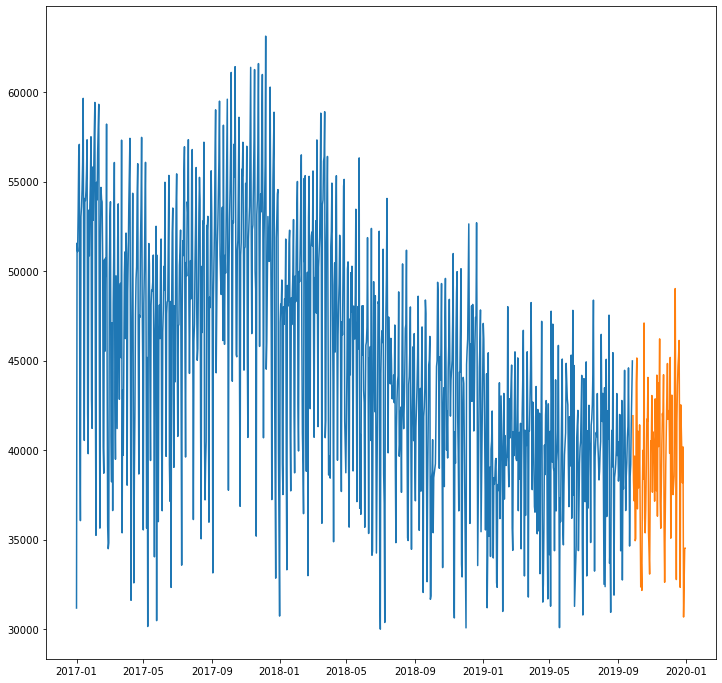

In [84]:
train = diario.cantidad_pasos[:1000]
test = diario.cantidad_pasos[-95:]
plt.plot(train)
plt.plot(test)

#### Autoarima

Aquí, estamos probando con los valores p, d, q que van de 0 a 5 para obtener mejores valores óptimos del modelo

In [85]:
from pmdarima.arima import auto_arima
auto_arima = auto_arima(train, start_p = 0,d=1,start_q = 0,
                       max_p = 20,max_d = 5,max_q = 20)

In [86]:
print(auto_arima.summary())

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                 1000
Model:               SARIMAX(7, 1, 1)   Log Likelihood               -9849.374
Date:                Mon, 07 Jun 2021   AIC                          19716.747
Time:                        13:36:26   BIC                          19760.908
Sample:                             0   HQIC                         19733.532
                               - 1000                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.2531      0.026      9.654      0.000       0.202       0.304
ar.L2         -0.1339      0.029     -4.594      0.000      -0.191      -0.077
ar.L3          0.0069      0.031      0.225      0.8

Si comparamos el AIC con el primer modelo arima, el segundo nos ofrece mejor relevancia de los parametros

### Predicción

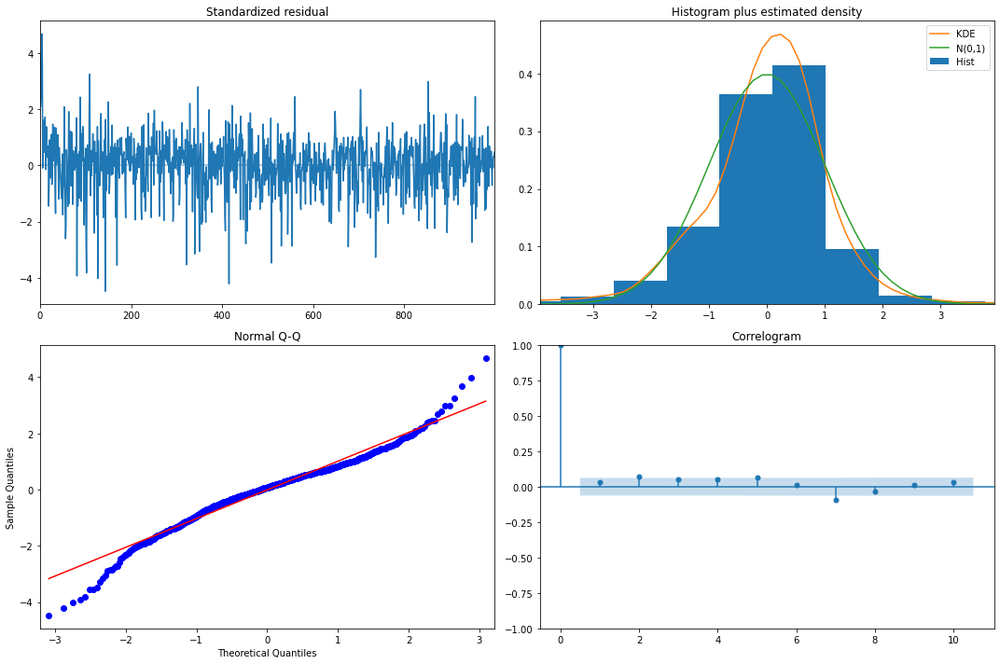

In [87]:
auto_arima.plot_diagnostics(figsize=(15,10))
plt.tight_layout()
plt.show()

Los errorres se nos comportan de una mejor forma en comparación del primer modelo de Arima, la distribción se asemeja más y el correlograma tiene los puntos en los intervalos de confianza

In [88]:
predes_  = pd.DataFrame(auto_arima.predict(n_periods=95), index=test.index)
predes_.columns = ['Pres']
predes_.head()

,Pres
fecha,
2019-09-28,40685.126607
2019-09-29,36907.573385
2019-09-30,38102.994508
2019-10-01,39231.269200
2019-10-02,40753.779380


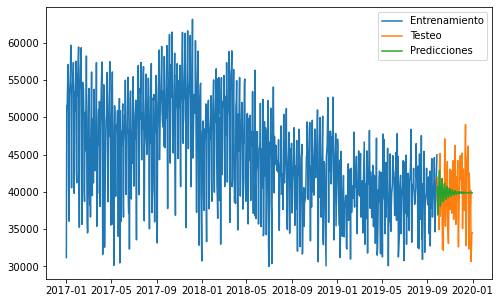

In [90]:
plt.figure(figsize=(8,5))
plt.plot(train, label = 'Entrenamiento')
plt.plot(test,label = 'Testeo')
plt.plot(predes_,label = 'Predicciones')
plt.legend()
plt.show()

El modelo Arima no predice la cantidad de datos que deberia

In [91]:
predes_.head()

,Pres
fecha,
2019-09-28,40685.126607
2019-09-29,36907.573385
2019-09-30,38102.994508
2019-10-01,39231.269200
2019-10-02,40753.779380


In [92]:
from sklearn.metrics import r2_score
test['predes'] = predes
r2_score(test[:95],predes )

NameError: name 'predes' is not defined

Como se observa tenemos un R2 muy bajo lo cual lo convierte en un modelo inadecuado para los datos

## Machine Learning

Se propone entrenar un Random forest regressor y un XGBOOST regressor con el fin de predecir el futuro de la serie de tiempo

In [94]:
look_back = 100

In [96]:
diario.drop(columns='fecha_numeros', inplace=True)

KeyError: "['fecha_numeros'] not found in axis"

In [97]:
dd = diario.cantidad_pasos
dd.head()

fecha
2017-01-01    31183.0
2017-01-02    51568.0
2017-01-03    51093.0
2017-01-04    53332.0
2017-01-05    56486.0
Freq: D, Name: cantidad_pasos, dtype: float64

In [98]:
N = dd.shape[0]
X = np.zeros((N - look_back - 1,look_back))
y = np.zeros(N - look_back - 1)
print(X.shape, y.shape)

(994, 100) (994,)


In [99]:
for i in range(X.shape[0]):
   # X[i,:] = diario.values.iloc[i:i+look_back
    #y[i] = senial.values.iloc[i+look_back]
    X[i,:] = dd.iloc[i:i+look_back]
    y[i] = dd.iloc[i+look_back]

In [100]:
len(diario)
print()

In [102]:
N_train = 1000 - look_back # cantidad de instancias que vamos a usar para entrenar. 
N_test =  90#cantidad de puntos que vamos a usar para evaluar
N_total = N_train + N_test

length_total = N_train + N_test + look_back

X_train = X[:N_train,:]
y_train = y[:N_train]
print(X_train.shape, y_train.shape)

X_test = X[N_train:N_train+N_test,:]
y_test = y[N_train:N_train+N_test]
print(X_test.shape, y_test.shape)

(900, 100) (900,)
(90, 100) (90,)


In [103]:
from sklearn.metrics import mean_squared_error
from sklearn.ensemble import RandomForestRegressor
rf = RandomForestRegressor(n_estimators=500, random_state=42, n_jobs = 4).fit(X_train,y_train)

In [104]:
y_pred = rf.predict(X)
y_train_pred = rf.predict(X_train)
y_test_pred = rf.predict(X_test)

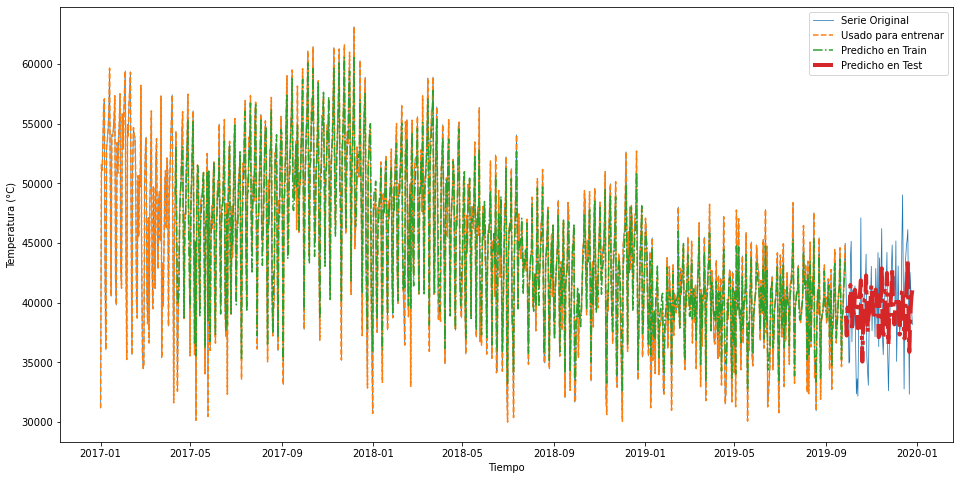

In [105]:
plt.figure(figsize=(16,8))
plt.plot(dd.index[:length_total], dd[:length_total],lw = 0.75, label = 'Serie Original')
plt.plot(dd.index[:N_train + look_back], dd[:N_train + look_back],'--', label = 'Usado para entrenar')
plt.plot(dd.index[look_back: look_back + N_train], y_train_pred,'-.',label = 'Predicho en Train')
plt.plot(dd.index[N_train+look_back: length_total], y_test_pred,'-.', lw = 4, label = 'Predicho en Test')
plt.legend()
plt.xlabel('Tiempo')
plt.ylabel('Temperatura (°C)')
plt.show()

In [106]:
print(r2_score(y_train,y_train_pred))
print(r2_score(y_test,y_test_pred))

0.9500958286366729
0.3890933385757498


El modelo estamuy bien entrenado para los datos de entrenamiento pero en caso de los datos de testeo brinda un bajo score

## boosting

Se propone un modelo boosting con el fin de evaluar la serie de tiempo

In [107]:
import xgboost as xgb
import scipy as sp 
from sklearn.model_selection import RandomizedSearchCV
from xgboost import XGBRegressor
model_boost = XGBRegressor()
param = {'n_estimators':sp.stats.randint(1, 15),'max_depth':sp.stats.randint(1, 15)}
xgboostre = RandomizedSearchCV(model_boost, param,n_iter=100, random_state=0, cv=5)
xgboostre.fit(X_train,y_train)

RandomizedSearchCV(cv=5,
                   estimator=XGBRegressor(base_score=None, booster=None,
                                          colsample_bylevel=None,
                                          colsample_bynode=None,
                                          colsample_bytree=None, gamma=None,
                                          gpu_id=None, importance_type='gain',
                                          interaction_constraints=None,
                                          learning_rate=None,
                                          max_delta_step=None, max_depth=None,
                                          min_child_weight=None, missing=nan,
                                          monotone_constraints=None,
                                          n_estimators=100, n...
                                          random_state=None, reg_alpha=None,
                                          reg_lambda=None,
                                          scale_pos_we

In [108]:
print("Mejores parametros: "+str(xgboostre.best_params_))
print("Mejor Score: "+str(xgboostre.best_score_)+'\n')

Mejores parametros: {'max_depth': 1, 'n_estimators': 11}
Mejor Score: 0.25578365134665926



El modelo de Boosting no predice de la mejor forma ya que unicamente alcanza un maximo resultado de un 25%

## Modelo de Aroboles

In [109]:
from sklearn.tree import DecisionTreeRegressor
treem = DecisionTreeRegressor()
param_dist = {'splitter':['best', 'random'],'max_depth':sp.stats.randint(1, 30),'max_features':['auto','sqrt','log2']}
tree_random = RandomizedSearchCV(treem, param_dist,n_iter=100, random_state=0, cv=5)
tree_random.fit(X_train,y_train)

RandomizedSearchCV(cv=5, estimator=DecisionTreeRegressor(), n_iter=100,
                   param_distributions={'max_depth': <scipy.stats._distn_infrastructure.rv_frozen object at 0x00000259DC91CE80>,
                                        'max_features': ['auto', 'sqrt',
                                                         'log2'],
                                        'splitter': ['best', 'random']},
                   random_state=0)

In [110]:
print("Mejores parametros: "+str(tree_random.best_params_))
print("Mejor Score: "+str(tree_random.best_score_)+'\n')

Mejores parametros: {'max_depth': 4, 'max_features': 'auto', 'splitter': 'random'}
Mejor Score: 0.1839218451699484



Al intentar quitarle complejidad al modelo unicamente bajamos el score que tenía el modelo

## Multi-Step Prediction

In [111]:
y_ms_test_pred = []
x = X_test[0,:] # arrancamos con la primera instancias del conjunto de test
for i in range(y_test.size):
    y_os_pred = rf.predict(x.reshape(1,-1))
    y_ms_test_pred.append(y_os_pred)
    x = np.append(x[1:], y_os_pred)
y_ms_test_pred = np.array(y_ms_test_pred)

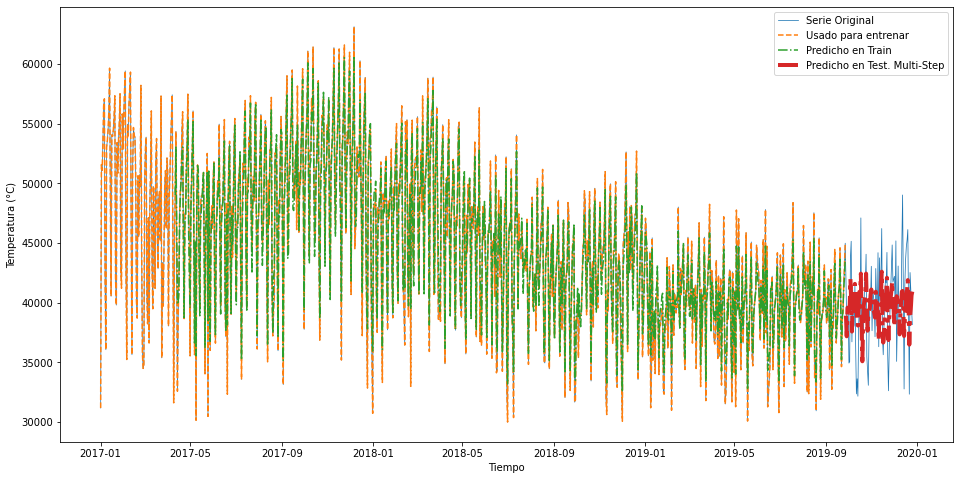

In [112]:
plt.figure(figsize=(16,8))
plt.plot(dd.index[:length_total], dd[:length_total],lw = 0.75, label = 'Serie Original')
plt.plot(dd.index[:N_train + look_back], dd[:N_train + look_back],'--', label = 'Usado para entrenar')
plt.plot(dd.index[look_back: look_back + N_train], y_train_pred,'-.',label = 'Predicho en Train')
plt.plot(dd.index[N_train+look_back: length_total], y_ms_test_pred,'-.', lw = 4, label = 'Predicho en Test. Multi-Step')
plt.legend()
plt.xlabel('Tiempo')
plt.ylabel('Temperatura (°C)')
plt.show()

Los valores siguen generando overfiting en los datos de entrenamiento que en los de testeo

## comparación de prophet

In [113]:
data_2020 = pd.read_csv('flujo-vehicular-2020.csv')
data_2020.head(2)

,periodo,fecha,mes,dia,dia_fecha,hora_inicio,hora_fin,estacion,tipo_vehiculo,forma_pago,observacion,sentido,cantidad_pasos
0,2020.0,2020-01-01 00:00:00,enero,Miércoles,1.0,0.0,1.0,ALBERDI,Auto,Efectivo,Efectivo,Centro,24.0
1,2020.0,2020-01-01 00:00:00,enero,Miércoles,1.0,0.0,1.0,ALBERDI,Auto,Efectivo,Efectivo,Provincia,80.0


In [114]:
mask2 = np.logical_and(data_2020.estacion=='ILLIA', data_2020.forma_pago == 'Efectivo')
data = data_2020[mask2]
#mask3 = np.logical_and(data.estacion=='Illia', data.forma_pago == 'EFECTIVO')
#data = data[mask3]

#Quitamos las columnas que no vamos a utilizar
data.drop(columns = ['periodo','hora_inicio','forma_pago', 'estacion'], inplace = True)

data.head()

C:\Users\Usuario\miniconda3\lib\site-packages\pandas\core\frame.py:4163: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,fecha,mes,dia,dia_fecha,hora_fin,tipo_vehiculo,observacion,sentido,cantidad_pasos
52,2020-01-01 00:00:00,enero,Miércoles,1.0,1.0,Auto,Efectivo,Centro,326.0
53,2020-01-01 00:00:00,enero,Miércoles,1.0,1.0,Auto,Efectivo,Provincia,319.0
134,2020-01-01 00:00:00,enero,Miércoles,1.0,2.0,Auto,Efectivo,Centro,199.0
135,2020-01-01 00:00:00,enero,Miércoles,1.0,2.0,Auto,Efectivo,Provincia,180.0
202,2020-01-01 00:00:00,enero,Miércoles,1.0,3.0,Auto,Efectivo,Centro,114.0


In [115]:
#Pasamos la columna fecha a formato datetime, y le unimos la hora_fin como hora
data['fecha2'] = pd.to_datetime(data.fecha) + pd.to_timedelta(data.hora_fin, unit = 'h')

#Quitamos las columnas fecha y hora_fin ya que las incluimos en el campo fecha2
data.drop(columns=['fecha','hora_fin'], inplace = True)

data.head()

<ipython-input-115-a32a8186ebb7>:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Usuario\miniconda3\lib\site-packages\pandas\core\frame.py:4163: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,mes,dia,dia_fecha,tipo_vehiculo,observacion,sentido,cantidad_pasos,fecha2
52,enero,Miércoles,1.0,Auto,Efectivo,Centro,326.0,2020-01-01 01:00:00
53,enero,Miércoles,1.0,Auto,Efectivo,Provincia,319.0,2020-01-01 01:00:00
134,enero,Miércoles,1.0,Auto,Efectivo,Centro,199.0,2020-01-01 02:00:00
135,enero,Miércoles,1.0,Auto,Efectivo,Provincia,180.0,2020-01-01 02:00:00
202,enero,Miércoles,1.0,Auto,Efectivo,Centro,114.0,2020-01-01 03:00:00


In [116]:
#Resampleamos nuestros datos para agrupar por dia, y asi tal vez lograr una visualización mas amigable
diario_2 = data.resample('D', on = 'fecha2').sum()
print(diario_2.shape)
diario_2.head()

(366, 2)


,dia_fecha,cantidad_pasos
fecha2,,
2020-01-01,184.0,21395.0
2020-01-02,408.0,33722.0
2020-01-03,618.0,37067.0
2020-01-04,824.0,30627.0
2020-01-05,1085.0,27812.0


In [117]:
diario_2.drop(columns = ['dia_fecha'], inplace= True)

C:\Users\Usuario\miniconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



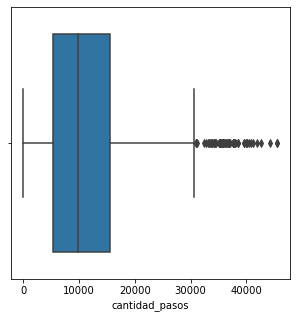

In [118]:
plt.figure(figsize=(5,5))
sns.boxplot(diario_2.cantidad_pasos)
plt.show()

Valores atipicos depues de 30.000 pasos

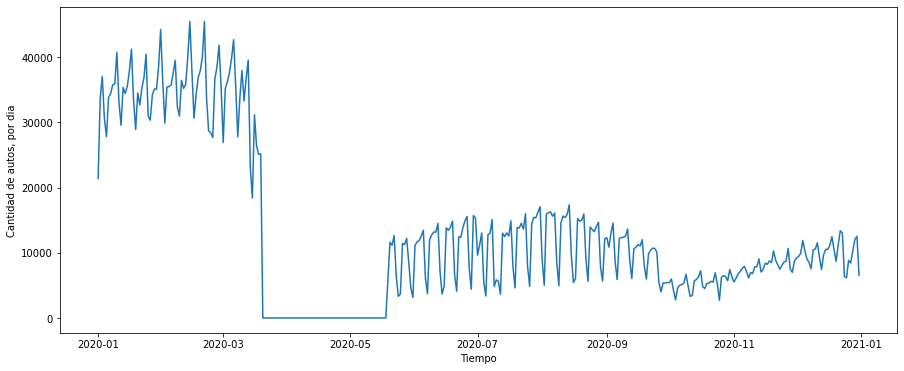

In [119]:
plt.figure(figsize = (15,6))
plt.plot(diario_2.index, diario_2.cantidad_pasos)
plt.xlabel('Tiempo')
plt.ylabel('Cantidad de autos, por dia')
plt.show()

Se toman los datos unicamente de los tres primeros meses ya que a partir de marzo se encuentra un comportamiento extraño en la serie, esto puede ser debido a una crisis social o a la pandemia por la Covid 19

In [120]:
compara = forecast[forecast.ds >= '2020-01-01']

In [121]:
diario_2.tail()

,cantidad_pasos
fecha2,
2020-12-27,8434.0
2020-12-28,10311.0
2020-12-29,12036.0
2020-12-30,12527.0
2020-12-31,6553.0


In [122]:
compara.tail(2)

,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,weekly,weekly_lower,weekly_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
1458,2020-12-29,35182.072500,29320.092318,40406.258464,33411.277407,36899.415011,-262.859785,-262.859785,-262.859785,196.116027,196.116027,196.116027,-458.975812,-458.975812,-458.975812,0.0,0.0,0.0,34919.212715
1459,2020-12-30,35174.083539,30623.347711,42301.168981,33393.626595,36898.089159,1135.998317,1135.998317,1135.998317,1800.808263,1800.808263,1800.808263,-664.809946,-664.809946,-664.809946,0.0,0.0,0.0,36310.081856


In [123]:
compara_n = diario_2[diario_2.index<='2020-03-01']

In [124]:
compara = compara[compara.ds<= '2020-03-01']

In [125]:
print(len(compara_n))
print(len(compara))

61
61


In [127]:
compara_n.head(10)
compara_n = compara_n.reset_index()

In [128]:
tabla_compara =  compara[['ds','yhat_lower','yhat_upper','yhat']]
tabla_compara = tabla_compara.reset_index()
tabla_compara['valor_real'] = compara_n.cantidad_pasos

In [129]:
tabla_compara

,index,ds,yhat_lower,yhat_upper,yhat,valor_real
0,1095,2020-01-01,33414.867269,44284.209374,38982.068667,21395.0
1,1096,2020-01-02,34871.705676,45326.166721,39997.687971,33722.0
2,1097,2020-01-03,36361.567727,46964.548329,41790.001914,37067.0
3,1098,2020-01-04,29079.731438,39514.959608,34187.503258,30627.0
4,1099,2020-01-05,24402.151630,35348.614531,30209.746236,27812.0
...,...,...,...,...,...,...
56,1151,2020-02-26,33488.041502,43963.265755,38628.796690,36706.0
57,1152,2020-02-27,34616.085412,45078.814701,39818.830461,38474.0
58,1153,2020-02-28,36220.773745,47131.650747,41779.877936,41855.0
59,1154,2020-02-29,28634.874980,39593.940750,34338.907671,35449.0


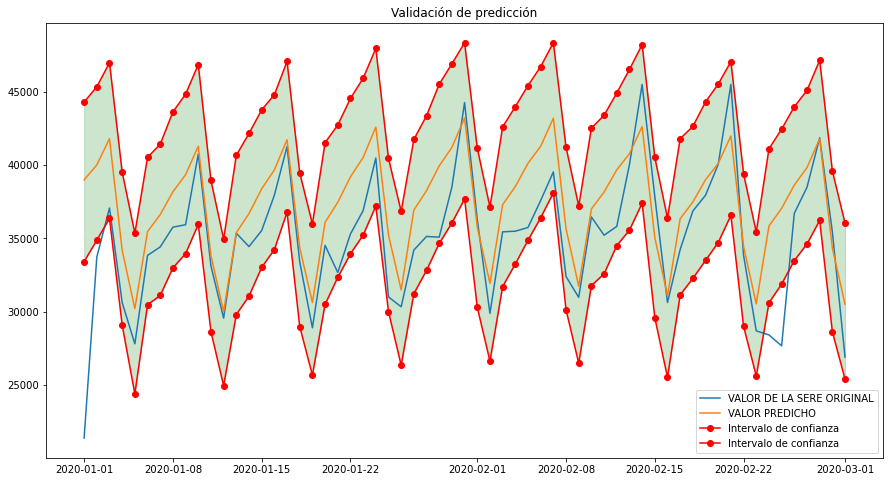

In [204]:
plt.figure(figsize=(15,8))
plt.plot(tabla_compara.ds,tabla_compara.valor_real, label = 'VALOR DE LA SERE ORIGINAL')
plt.plot(tabla_compara.ds,tabla_compara.yhat, label = 'VALOR PREDICHO')
plt.plot(tabla_compara.ds,tabla_compara.yhat_lower, 'o-',color = 'red', label = 'Intervalo de confianza')
plt.plot(tabla_compara.ds,tabla_compara.yhat_upper, 'o-',color  = 'red', label = 'Intervalo de confianza')
plt.fill_between(tabla_compara.ds, tabla_compara.yhat_upper,tabla_compara.yhat_lower, alpha=0.2, color ='g')
plt.legend()
plt.title('Validación de predicción')
plt.show()

Se observa en gráfica que aunque no precisamente los valores predichos tocan los valore reales, sin embargo los valores reales estan dentro del intervalo de confianza que crea prophet. haciendo un modelo muy preciso y nos da una idea para predicciónes futuras

## Nuevo problema

Teniendo en cuenta los datos dados en el 2020 calcular un ronostico de la dantidad, de pasos.
* ¿El modelo tiene una tendencia alcista o bajista?
* ¿La crisis sanitaria tubo algo que ver? 

In [131]:
Data_2020 = pd.read_csv('flujo-vehicular-2020.csv', sep =',')
Data_2019 = pd.read_csv('flujo-vehicular-2019.csv', sep =',')
data_2018 = pd.read_csv('flujo-vehicular-2018.csv', sep =',')
data_2017 = pd.read_csv('flujo-vehicular-2017.csv', sep =',')

In [133]:
#Unimos los 3 datasets, podemos hacerlo asi directamente ya que tienen las mismas columnas
data = pd.concat([Data_2020, Data_2019, data_2018, data_2017])

#Nos quedamos solamente con la estación Illia y la forma de pago Efectivo
mask2 = np.logical_and(data.estacion=='Illia', data.forma_pago == 'EFECTIVO')
data = data[mask2]

#Quitamos las columnas que no vamos a utilizar
data.drop(columns = ['periodo','hora_inicio','forma_pago', 'estacion'], inplace = True)

dataset.head()

,dia,sentido,tipo_vehiculo,cantidad_pasos,fecha
0,Domingo,Provincia,Pesado,1,2017-01-01
1,Domingo,Provincia,Liviano,9,2017-01-01
2,Domingo,Provincia,Liviano,644,2017-01-01
3,Domingo,Provincia,Pesado,6,2017-01-01
4,Domingo,Provincia,Pesado,1,2017-01-01


In [135]:
#Pasamos la columna fecha a formato datetime, y le unimos la hora_fin como hora
data['fecha2'] = pd.to_datetime(data.fecha) + pd.to_timedelta(data.hora_fin, unit = 'h')

#Quitamos las columnas fecha y hora_fin ya que las incluimos en el campo fecha2
data.drop(columns=['fecha','hora_fin'], inplace = True)

dataset.head()

,dia,sentido,tipo_vehiculo,cantidad_pasos,fecha
0,Domingo,Provincia,Pesado,1,2017-01-01
1,Domingo,Provincia,Liviano,9,2017-01-01
2,Domingo,Provincia,Liviano,644,2017-01-01
3,Domingo,Provincia,Pesado,6,2017-01-01
4,Domingo,Provincia,Pesado,1,2017-01-01


In [137]:
#Corregimos el nombre de fecha2 a fecha
data.rename(columns = {'fecha2':'fecha'}, inplace = True) 
data.head()

,mes,dia,dia_fecha,tipo_vehiculo,observacion,sentido,cantidad_pasos,fecha
80,NaN,Martes,NaN,Liviano,NaN,Centro,537.0,2019-01-01 02:00:00
86,NaN,Martes,NaN,Pesado,NaN,Centro,1.0,2019-01-01 02:00:00
88,NaN,Martes,NaN,Liviano,NaN,Provincia,443.0,2019-01-01 02:00:00
94,NaN,Martes,NaN,Pesado,NaN,Provincia,1.0,2019-01-01 02:00:00
149,NaN,Martes,NaN,Liviano,NaN,Centro,769.0,2019-01-01 03:00:00


In [139]:
#Reordenamos el dataset por fecha
data.sort_values('fecha', inplace = True)
data.reset_index(drop=True, inplace = True)
data

,mes,dia,dia_fecha,tipo_vehiculo,observacion,sentido,cantidad_pasos,fecha
0,NaN,Domingo,NaN,Pesado,NaN,Provincia,1.0,2017-01-01 00:00:00
1,NaN,Domingo,NaN,Liviano,NaN,Provincia,9.0,2017-01-01 00:00:00
2,NaN,Domingo,NaN,Liviano,NaN,Provincia,644.0,2017-01-01 00:00:00
3,NaN,Domingo,NaN,Pesado,NaN,Provincia,6.0,2017-01-01 00:00:00
4,NaN,Domingo,NaN,Pesado,NaN,Provincia,1.0,2017-01-01 00:00:00
...,...,...,...,...,...,...,...,...
238864,NaN,Martes,NaN,Liviano,NaN,Provincia,556.0,2019-12-31 22:00:00
238865,NaN,Martes,NaN,Pesado,NaN,Provincia,1.0,2019-12-31 22:00:00
238866,NaN,Martes,NaN,Liviano,NaN,Centro,580.0,2019-12-31 22:00:00
238867,NaN,Martes,NaN,Liviano,NaN,Centro,214.0,2019-12-31 23:00:00


In [140]:
data.drop(columns=['mes','dia','dia_fecha','tipo_vehiculo','observacion','sentido',], inplace=True)

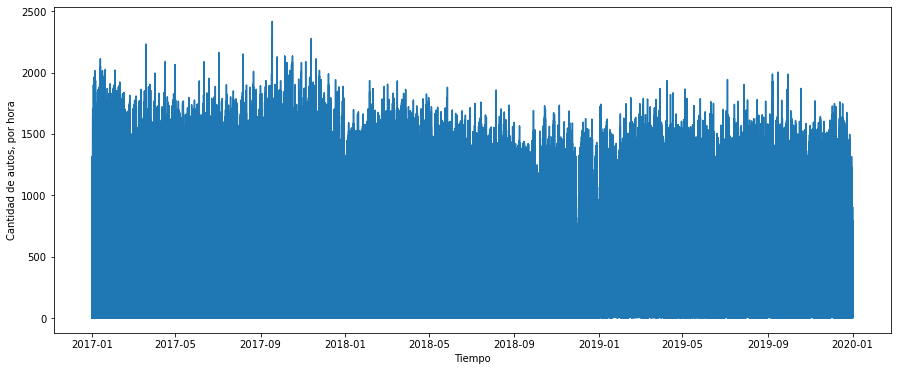

In [142]:
plt.figure(figsize = (15,6))
plt.plot(data.fecha, data.cantidad_pasos)
plt.xlabel('Tiempo')
plt.ylabel('Cantidad de autos, por hora')
plt.show()

In [143]:
diario_2020 = data.resample('D', on = 'fecha').sum()
print(diario_2020.shape)
diario.head()

(1095, 1)


,cantidad_pasos
fecha,
2017-01-01,31183.0
2017-01-02,51568.0
2017-01-03,51093.0
2017-01-04,53332.0
2017-01-05,56486.0


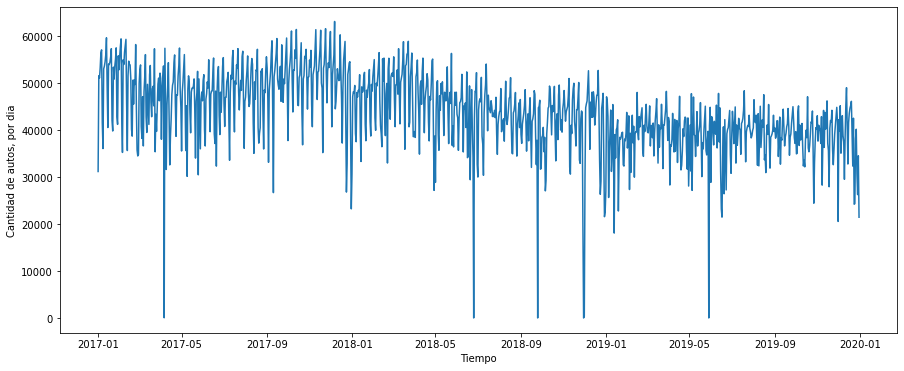

In [144]:
plt.figure(figsize = (15,6))
plt.plot(diario_2020.index, diario_2020.cantidad_pasos)
plt.xlabel('Tiempo')
plt.ylabel('Cantidad de autos, por dia')
plt.show()

In [145]:
semanal_2020 = data.resample('W', on = 'fecha').mean()

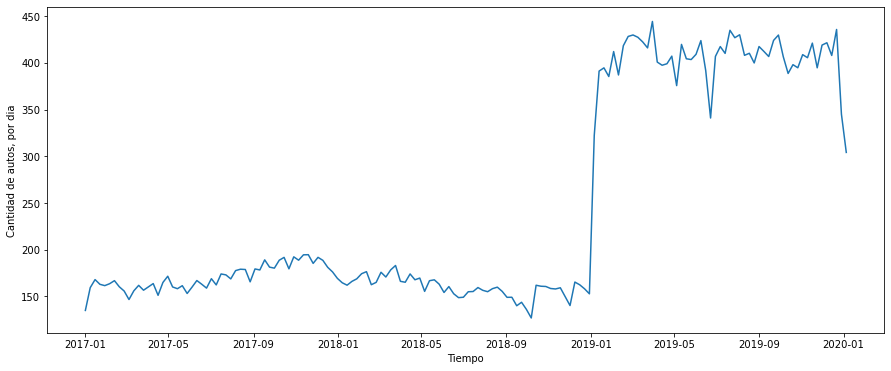

In [146]:
plt.figure(figsize = (15,6))
plt.plot(semanal_2020.index, semanal_2020.cantidad_pasos)
plt.xlabel('Tiempo')
plt.ylabel('Cantidad de autos, por dia')
plt.show()

In [147]:
diario_2020.cantidad_pasos[diario_2020.cantidad_pasos < 30000] = np.nan
diario_2020 = diario_2020.interpolate()

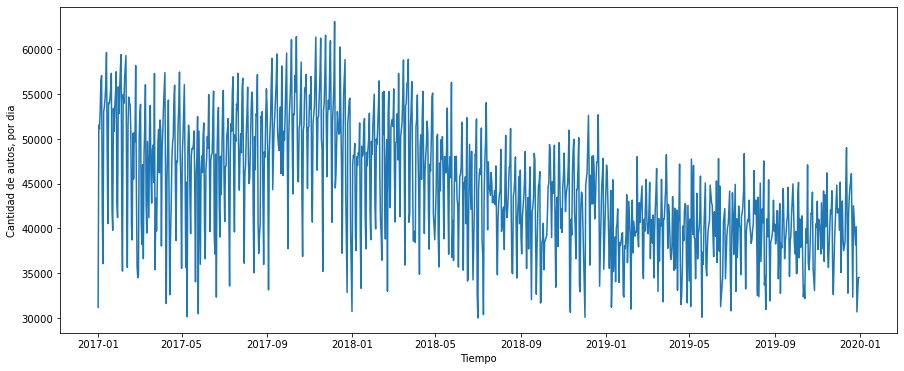

In [148]:
plt.figure(figsize = (15,6))
plt.plot(diario_2020.index, diario_2020.cantidad_pasos)
plt.xlabel('Tiempo')
plt.ylabel('Cantidad de autos, por dia')
plt.show()

In [158]:
ventana_1 = int(365*1/9)# ventana de fecha
diario_promedio_tendencia_1 = diario_2020.cantidad_pasos.rolling(window=ventana_1, center = True).mean()

In [160]:
diario_2020['fecha_numeros']= diario_2020.index.map(datetime.datetime.toordinal)
diario_2020.head()

,cantidad_pasos,fecha_numeros
fecha,,
2017-01-01,31183.0,736330
2017-01-02,51568.0,736331
2017-01-03,51093.0,736332
2017-01-04,53332.0,736333
2017-01-05,56486.0,736334


In [161]:
from sklearn.linear_model import LinearRegression
lr_1 = LinearRegression()
lr_1.fit(diario_2020.fecha_numeros.values.reshape(-1, 1), diario.cantidad_pasos)

LinearRegression()

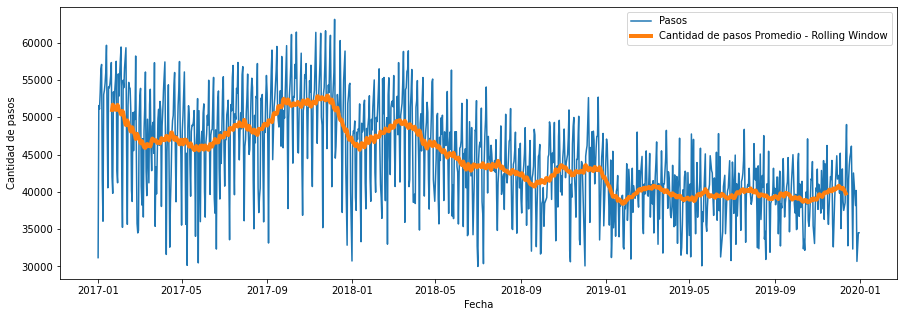

In [159]:
plt.figure(figsize = (15,5))
plt.plot(diario_2020.index, diario_2020.cantidad_pasos, label = 'Pasos')
plt.plot(diario_promedio_tendencia_1, lw = 4, label = 'Cantidad de pasos Promedio - Rolling Window')
plt.xlabel('Fecha')
plt.ylabel('Cantidad de pasos')
plt.legend()
plt.show()

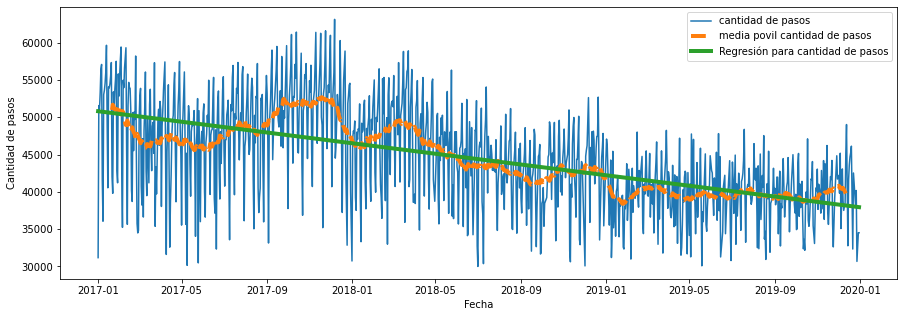

In [162]:
plt.figure(figsize = (15,5))
plt.plot(diario_2020.index, diario_2020.cantidad_pasos,label = 'cantidad de pasos')
plt.plot(diario_promedio_tendencia_1, ls = '--', lw = 4, label = 'media povil cantidad de pasos')
plt.plot(diario_2020.index, lr_1.predict(diario_2020.fecha_numeros.values.reshape(-1, 1)), lw = 4, label = 'Regresión para cantidad de pasos')
# plt.xlim(datetime.date(1985,1,1), datetime.date(2018,1,1))
# plt.ylim([0,30])
plt.xlabel('Fecha')
plt.ylabel('Cantidad de pasos')
plt.legend()
plt.show()

Se observa que la tendencia de la cantidad de pasos en los peajes sigue siendpo negativa

In [163]:
from statsmodels.tsa.seasonal import seasonal_decompose # descomposición utilizando medias moviles

result_1 = seasonal_decompose(diario_2020.cantidad_pasos, model='additive')

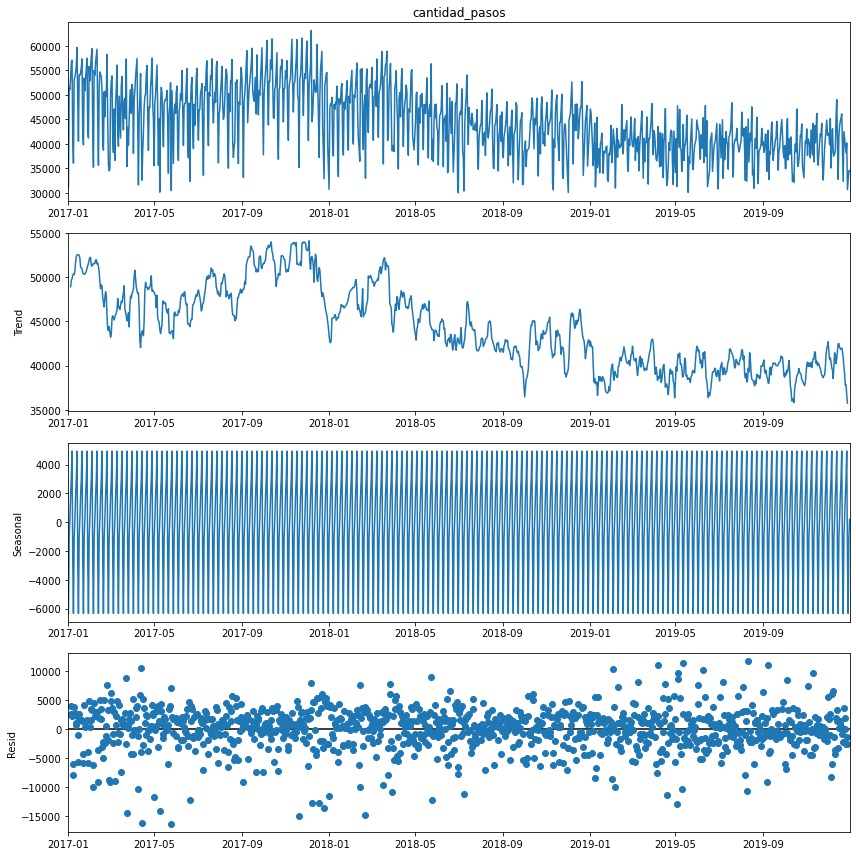

In [164]:
plt.rcParams['figure.figsize'] = [12,12]
result_1.plot()
plt.show()

El comportamiento de la tendencia sigue siendo bajista pero sigue teniendo bolatilidad 

In [165]:
tms_p_1 = {'ds':diario_2020.index,'y':diario_2020['cantidad_pasos']}
tms_p_1 = pd.DataFrame(tms_p_1)
tms_p_1 = tms_p_1.reset_index()
tms_p_1.drop(columns=['fecha'],inplace= True)
tms_p_1.head()

,ds,y
0,2017-01-01,31183.0
1,2017-01-02,51568.0
2,2017-01-03,51093.0
3,2017-01-04,53332.0
4,2017-01-05,56486.0


In [166]:
from prophet import Prophet
m_1 = Prophet()
m_1.fit(tms_p_1)

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


In [167]:
future_1 = m_1.make_future_dataframe(periods=365)
future_1.head()

,ds
0,2017-01-01
1,2017-01-02
2,2017-01-03
3,2017-01-04
4,2017-01-05


In [168]:
forecast = m_1.predict(future_1)
forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].head()

,ds,yhat,yhat_lower,yhat_upper
0,2017-01-01,41355.084436,36136.120951,46891.494925
1,2017-01-02,46543.683699,41405.666276,51801.705009
2,2017-01-03,47642.512021,42143.985224,52808.013302
3,2017-01-04,49133.888002,43826.970400,54416.775160
4,2017-01-05,50235.290792,44913.452681,55368.782288


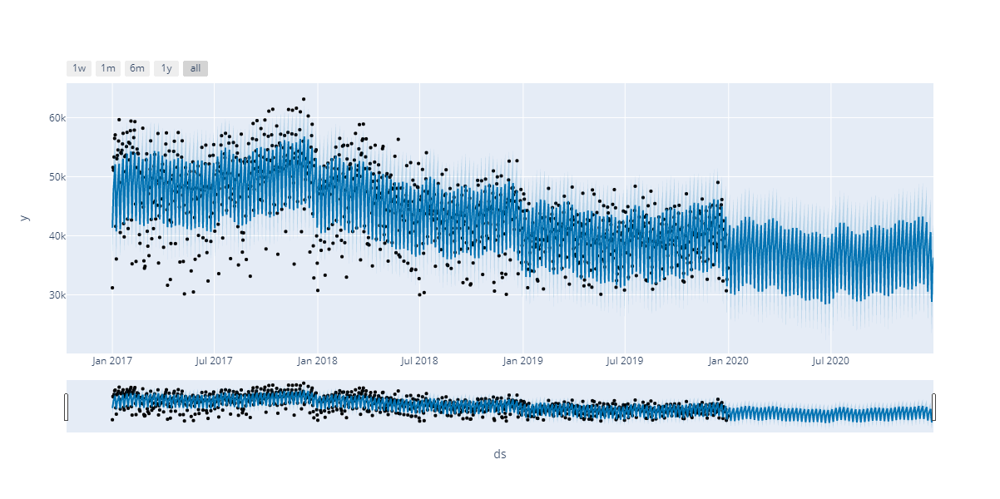

In [169]:
from prophet.plot import plot_plotly, plot_components_plotly

plot_plotly(m_1, forecast)

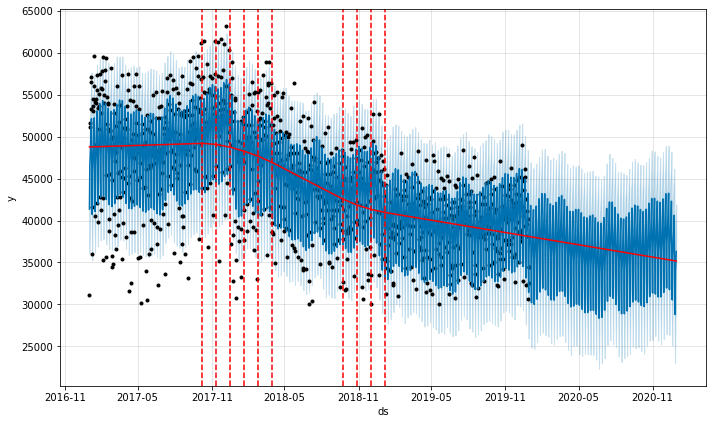

In [170]:
from prophet.plot import add_changepoints_to_plot
fig = m_1.plot(forecast)
a = add_changepoints_to_plot(fig.gca(), m_1, forecast)

No se presentan cambios de tendencia importantes, es decir que es constante la tendencia antes dicha

In [171]:
from prophet.diagnostics import cross_validation
df_cv_1 = cross_validation(m_1, initial='350 days', period='50 days', horizon = '700 days')

INFO:prophet:Making 1 forecasts with cutoffs between 2018-01-30 00:00:00 and 2018-01-30 00:00:00


In [172]:
from prophet.diagnostics import performance_metrics
df_p = performance_metrics(df_cv_1)
df_p.head()

,horizon,mse,rmse,mae,mape,mdape,smape,coverage
0,70 days,5.800021e+07,7615.786707,6715.649798,0.138625,0.151224,0.148226,0.342857
1,71 days,5.799399e+07,7615.378439,6711.080235,0.138555,0.151224,0.148155,0.342857
2,72 days,5.848893e+07,7647.805693,6778.255816,0.139840,0.151224,0.149536,0.328571
3,73 days,5.913924e+07,7690.204095,6860.729059,0.141329,0.151224,0.151139,0.314286
4,74 days,6.009019e+07,7751.786471,6960.093409,0.143410,0.154012,0.153470,0.300000


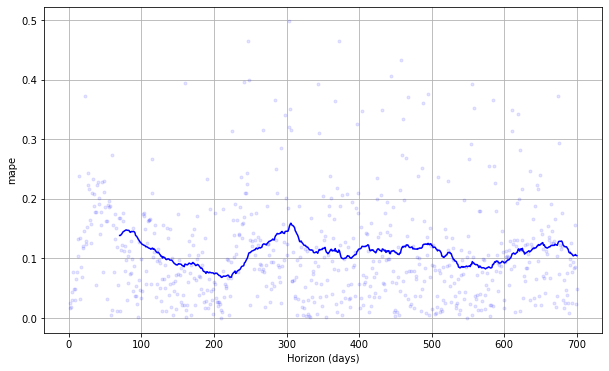

In [174]:
from prophet.plot import plot_cross_validation_metric
fig = plot_cross_validation_metric(df_cv_1, metric='mape')

El error de la validación cruzada se aproximó a un 15%, lo cual hace que sea un modelo muy eficiente

In [176]:
forecast.head(2)

,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,weekly,weekly_lower,weekly_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
0,2017-01-01,48764.283849,36136.120951,46891.494925,48764.283849,48764.283849,-7409.199413,-7409.199413,-7409.199413,-6379.563785,-6379.563785,-6379.563785,-1029.635628,-1029.635628,-1029.635628,0.0,0.0,0.0,41355.084436
1,2017-01-02,48765.706246,41405.666276,51801.705009,48765.706246,48765.706246,-2222.022546,-2222.022546,-2222.022546,-1036.915760,-1036.915760,-1036.915760,-1185.106787,-1185.106787,-1185.106787,0.0,0.0,0.0,46543.683699


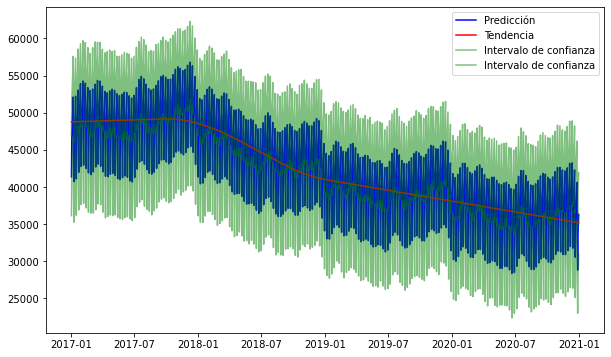

In [205]:
plt.figure(figsize=(10,6))
plt.plot(forecast.ds,forecast.yhat, color = 'blue',label = 'Predicción')
plt.plot(forecast.ds,forecast.trend, color = 'red', label = 'Tendencia')
plt.plot(forecast.ds,forecast.yhat_lower,color = 'green',alpha = 0.5,label = 'Intervalo de confianza')
plt.plot(forecast.ds,forecast.yhat_upper, color = 'green',alpha = 0.5, label = 'Intervalo de confianza')
plt.legend()
plt.show()

Hay una disminución de pasos, esto puede deberse a un cambio de precios, ya que segun la demanda a mayor precio siminuye la cantidad, o algun fenómeno social o político para que haya una tendencia bajista

### Mejora del modelo

**Opciones de mejora**  
Redes Neuronales  
A lo largo de la historia, el análisis de la evolución en el comportamiento de distintos procesos basado en los registros de datos históricos para su posterior interpretación y con el fin de entender y predecir el comportamiento de éstos procesos, ha capturado la atención de científicos y expertos en distintas áreas de conocimiento. Esta forma de agrupar los datos de manera cronológica es lo que se define como series temporales. Formalmente podemos definir una serie temporal como: una secuencia de datos, observaciones o valores, medidos en determinados momentos y ordenados cronológicamente. Estos datos pueden estar espaciados a intervalos iguales (como la temperatura en un observatorio meteorológico en días sucesivos) o desiguales (como el peso de una persona en sucesivas mediciones en el consultorio médico, la farmacia, etc.)
Las redes neuronales recurrentes constituyen una herramienta muy apropiada para modelar series temporales. Se trata de un tipo de redes con una arquitectura que implementa una cierta memoria y, por lo tanto, un sentido temporal. Esto se consigue implementando algunas neuronas que reciben como entrada la salida de una de las capas e inyectan su salida en una de las capas de un nivel anterior a ella.  
En las redes de Elman, las entradas de estas neuronas, se toman desde las salidas de las neuronas de una de las capas ocultas, y sus salidas se conectan de nuevo en las entradas de esta misma capa, lo que proporciona una especie de memoria sobre el estado anterior de dicha capa.  
Implementación de redes neuronales para predicción de consumo eléctrico: En esta etapa, se emplean redes neuronales para la estimación a futuro de consumo eléctrico por hora, usando como parámetros de entrada para la predicción, el registro histórico del consumo eléctrico de periodos anteriores, así como el comportamiento histórico de las condiciones meteorológicas para un periodo de tiempo determinado. Para la tarea de predicción se emplean redes de tipo Long Short Term Memory (LSTMs), siendo éstas un caso especial de redes neuronales tradicionales. Este tipo de especial de redes neuronales son ampliamente utilizadas en problemas de predicción en series temporales debido a que su diseño permite recordar la información durante largos períodos y facilita la tarea de hacer estimaciones futura empleando períodos de registros históricos. A diferencia de las redes neuronales tradicionales, en lugar de poseer neuronas de manera clásica, las redes LSTM tienen como neuronas bloques de memoria que están conectados a través de capas. Estos bloques de memoria facilitan la tarea de recordar valores para largos o cortos períodos de tiempo, por lo tanto, el valor almacenado no es reemplazado (al menos a corto plazo) de forma iterativa en el tiempo, y el término de gradiente no tiende a desaparecer cuando se aplica la retro-propagación (back-propagation método de aprendizaje) durante el proceso de entrenamiento, tal y como acontece en e uso de las redes neuronales clásicas.

**Variables Exogenas**  
Se pueden implementar variablesexogenas que puedan aportar información a un modelo de machine learning con eso tener más información y podere redecir el futuro de la serie temporal

Para mejorjar performance del modelo se pretende usar un modelo de deep learning ya en las tecnologias modernas son las más usadas cuando se tiene una gran cantidad de datos